## 1️⃣ Import Libraries and Configuration

**Task**: Import all necessary libraries and set up configuration parameters.

**Requirements**:
- Import PyTorch, torchvision, and GAN-specific libraries
- Import visualization and utility libraries
- Set random seeds for reproducibility
- Configure training hyperparameters

In [ ]:
# Import core PyTorch libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils

# Import dataset and data handling
import kagglehub
from PIL import Image
import os
import glob
from torch.utils.data import DataLoader, Dataset

# Import visualization and utilities
import matplotlib.pyplot as plt
import numpy as np
import itertools
from tqdm import tqdm
import random
import requests
from io import BytesIO

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Check device availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Configuration parameters
IMG_SIZE = 64  # Image resolution (64x64)
BATCH_SIZE = 4  # Batch size (small due to memory constraints)
LEARNING_RATE = 0.0002  # Learning rate for both generators and discriminators
BETA1 = 0.5  # Beta1 for Adam optimizer
BETA2 = 0.999  # Beta2 for Adam optimizer
NUM_EPOCHS = 100  # Number of training epochs
LAMBDA_CYCLE = 10.0  # Weight for cycle consistency loss
LAMBDA_IDENTITY = 5.0  # Weight for identity loss
N_RESIDUAL_BLOCKS = 6  # Number of residual blocks in generator

# Additional parameters for new features
SAVE_INTERVAL = 2  # Save models every N epochs
PLOT_INTERVAL = 1  # Plot intermediate results every N epochs
SCHEDULER_STEP = 5  # Learning rate decay step
SCHEDULER_GAMMA = 0.5  # Learning rate decay factor
EARLY_STOPPING_PATIENCE = 5  # Early stopping patience
EARLY_STOPPING_DELTA = 0.001  # Minimum improvement for early stopping


Using device: cuda


## 2️⃣ Dataset Download and Loading

**Task**: Download the Selfie2Anime dataset and create data loaders.

**Requirements**:
- Download dataset using kagglehub
- Create custom dataset class for unpaired data
- Apply appropriate transformations (resize, normalize)
- Create train and test data loaders

In [ ]:
# Download the dataset
# try block to hanfle potential errors during download
try:
    path = kagglehub.dataset_download("arnaud58/selfie2anime") # local path
    print("Path to dataset files:", path)
except Exception as e:
    print(f"Download error: {e}")
    # Fallback to Kaggle input directory
    path = "/kaggle/input/selfie2anime"

# Define the correct dataset path structure
dataset_path = path
train_selfie_path = os.path.join(dataset_path, "trainA")
train_anime_path = os.path.join(dataset_path, "trainB")
test_selfie_path = os.path.join(dataset_path, "testA")
test_anime_path = os.path.join(dataset_path, "testB")

# Verify paths exist
print(f"Train selfie path exists: {os.path.exists(train_selfie_path)}")
print(f"Train anime path exists: {os.path.exists(train_anime_path)}")
print(f"Test selfie path exists: {os.path.exists(test_selfie_path)}")
print(f"Test anime path exists: {os.path.exists(test_anime_path)}")

# Define image transformations
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)), # Resizes each image to a square of `IMG_SIZE` x `IMG_SIZE` pixels
    transforms.ToTensor(), # convert images from PIL format (pixels 0-255) to a pytorch tensor (scaled 0.0-1.0)
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])

# Custom dataset class to handle the unpaired selfie and anime images
class SelfieAnimeDataset(Dataset):
    def __init__(self, root_selfie, root_anime, transform=None):
        self.transform = transform

        # Check if directories exist. If not, raise an error
        if not os.path.exists(root_selfie):
            raise FileNotFoundError(f"Selfie directory not found: {root_selfie}")
        if not os.path.exists(root_anime):
            raise FileNotFoundError(f"Anime directory not found: {root_anime}")

        # Load file lists
        # Gets a sorted list of all file paths in the selfie directory and stores it
        self.selfie_files = sorted(glob.glob(os.path.join(root_selfie, "*")))
        self.anime_files = sorted(glob.glob(os.path.join(root_anime, "*")))

        # if selfie/anime file list is empty, raise an error
        if len(self.selfie_files) == 0:
            raise ValueError(f"No selfie images found in {root_selfie}")
        if len(self.anime_files) == 0:
            raise ValueError(f"No anime images found in {root_anime}")

        #store number of selfie and anime images
        self.selfie_len = len(self.selfie_files)
        self.anime_len = len(self.anime_files)
        self.max_len = max(self.selfie_len, self.anime_len)

        # print how many images were found
        print(f"Loaded {self.selfie_len} selfie images and {self.anime_len} anime images")

    # return total number of samples in dataset
    def __len__(self):
        return self.max_len

    # retrieve a single data item (unpaired selfie and anime image) at specific index
    def __getitem__(self, idx):
        selfie_path = self.selfie_files[idx % self.selfie_len]
        anime_path = self.anime_files[idx % self.anime_len]

        try:
            # open images and convert to RGB
            selfie_img = Image.open(selfie_path).convert('RGB')
            anime_img = Image.open(anime_path).convert('RGB')
        # Catch any exceptions during the image loading
        except Exception as e:
            print(f"Error loading images: {e}")
            raise

        # if a transformation pipeline was defined, apply the defined transform to  the images
        if self.transform:
            selfie_img = self.transform(selfie_img)
            anime_img = self.transform(anime_img)

        return selfie_img, anime_img

# Create datasets with error handling
try:
    train_dataset = SelfieAnimeDataset(train_selfie_path, train_anime_path, transform)
    test_dataset = SelfieAnimeDataset(test_selfie_path, test_anime_path, transform)

    print(f"✅ Dataset loaded successfully!")
    print(f"Train dataset size: {len(train_dataset)}")
    print(f"Test dataset size: {len(test_dataset)}")

except Exception as e:
    print(f"❌ Error creating datasets: {e}")
    raise

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print(f"Number of train batches: {len(train_loader)}")
print(f"Number of test batches: {len(test_loader)}")


Path to dataset files: /kaggle/input/selfie2anime
Train selfie path exists: True
Train anime path exists: True
Test selfie path exists: True
Test anime path exists: True
Loaded 3400 selfie images and 3400 anime images
Loaded 100 selfie images and 100 anime images
✅ Dataset loaded successfully!
Train dataset size: 3400
Test dataset size: 100
Number of train batches: 850
Number of test batches: 25


## 3️⃣ Generator Architecture

**Task**: Implement the Generator network with residual blocks.

**Requirements**:
- Create ResidualBlock class with skip connections
- Implement Generator with encoder-decoder structure
- Use reflection padding and instance normalization
- Include downsampling, residual blocks, and upsampling

In [ ]:
# Generator network
# ResidualBlock class with skip connections
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.ReflectionPad2d(1), #add a 1-pixel border by mirroring the edge pixels, better than zero-padding for avoiding artifacts at image borders
            nn.Conv2d(in_features, in_features, kernel_size=3),
            nn.InstanceNorm2d(in_features), # normalizes the data per-image, per-channel
            nn.ReLU(inplace=True), # inplace=True is a memory optimization
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, kernel_size=3),
            nn.InstanceNorm2d(in_features)
        )

    def forward(self, x):
        return x + self.conv_block(x) #the residual block adds the original input to the processed output

# Generator class with encoder-decoder structure
class Generator(nn.Module):
    def __init__(self, input_nc=3, output_nc=3, n_residual_blocks=N_RESIDUAL_BLOCKS):
        super(Generator, self).__init__()

        # ENCODER: initial convolution block
        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_nc, 64, kernel_size=7),  # large 7x7 kernel to capture a wide receptive field
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        ]

        # ENCODER: downsampling layers
        in_features = 64
        out_features = in_features * 2
        for _ in range(2):
            model += [
                nn.Conv2d(in_features, out_features, kernel_size=3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features * 2

        # Residual blocks (bottleneck)
        for _ in range(n_residual_blocks):
            model += [ResidualBlock(in_features)]

        # DECODER: upsampling layers
        out_features = in_features // 2
        for _ in range(2):
            model += [
                nn.ConvTranspose2d(in_features, out_features, kernel_size=3, stride=2, padding=1, output_padding=1), # Transposed Convolution doubles the image dimensions
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features // 2

        # DECODER: output layer
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, output_nc, kernel_size=7),
            nn.Tanh() # output value [-1,1]
        ]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

# Test generator with random input
test_input = torch.randn(1, 3, IMG_SIZE, IMG_SIZE) # create random noise image
generator = Generator()
test_output = generator(test_input)
print(f"Generator input shape: {test_input.shape}")
print(f"Generator output shape: {test_output.shape}")
print(f"Generator parameters: {sum(p.numel() for p in generator.parameters()):,}")


Generator input shape: torch.Size([1, 3, 64, 64])
Generator output shape: torch.Size([1, 3, 64, 64])
Generator parameters: 7,837,699


## 4️⃣ Discriminator Architecture

**Task**: Implement the Discriminator network for adversarial training.

**Requirements**:
- Create PatchGAN discriminator architecture
- Use leaky ReLU activations and instance normalization
- Output patch-based predictions rather than single value
- Handle both real and fake image discrimination

In [ ]:
# Discriminator class (PatchGAN)
# PatchGAN slides across the image and outputs a grid of scores, where each score coresponds to a specific patch of the input image and represent how real that patch looks
class Discriminator(nn.Module):
    def __init__(self, input_nc=3):
        super(Discriminator, self).__init__()

        # helper function that creates a reusable block of layers
        def discriminator_block(in_filters, out_filters, normalize=True):
            layers = [nn.Conv2d(in_filters, out_filters, kernel_size=4, stride=2, padding=1)]
            # normalization flag controls whether to add a normalization layer
            # normalize True by default
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(input_nc, 64, normalize=False), #skip normalization in first layer to learn from raw features
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, kernel_size=4)
        )

    def forward(self, x):
        return self.model(x)

# Sanity check: test discriminator with random input
discriminator = Discriminator()
test_disc_output = discriminator(test_input) #same random input as before
print(f"Discriminator input shape: {test_input.shape}")
print(f"Discriminator output shape: {test_disc_output.shape}")
print(f"Discriminator parameters: {sum(p.numel() for p in discriminator.parameters()):,}")


Discriminator input shape: torch.Size([1, 3, 64, 64])
Discriminator output shape: torch.Size([1, 1, 2, 2])
Discriminator parameters: 2,764,737


## 5️⃣ Loss Functions

**Task**: Implement the three types of losses used in CycleGAN.

**Requirements**:
- Adversarial loss for generator and discriminator training
- Cycle consistency loss to ensure cycle A→B→A ≈ A
- Identity loss to preserve color composition
- Combine losses with appropriate weights

In [ ]:
# CycleGAN Loss class
class CycleGANLoss(nn.Module):
    def __init__(self, lambda_cyc=LAMBDA_CYCLE, lambda_id=LAMBDA_IDENTITY):
        super(CycleGANLoss, self).__init__()
        self.lambda_cyc = lambda_cyc # weight of cycle consistency loss
        self.lambda_id = lambda_id # weight of identity loss
        self.mse_loss = nn.MSELoss() # MSE for adversarial loss
        self.l1_loss = nn.L1Loss() # MAE for cycle and identity losses

    # Adversarial loss measures how well the genertor is fooling the discriminator
    # The generator wants the discriminator to believe its images are real. So it tries to minimize  the difference between the discrimiantor's predictions and a target of ones
    def adversarial_loss(self, pred, target_is_real):
        target = torch.ones_like(pred) if target_is_real else torch.zeros_like(pred)
        return self.mse_loss(pred, target)

    # cycle consistency loss ensures that if you translate an image from domain A to B and then back to A, you should get something very close to the original image
    def cycle_consistency_loss(self, real_images, cycled_images):
        return self.l1_loss(real_images, cycled_images)

    # identity loss encourages the generator to preserve the originaal image's color and composition
    def identity_loss(self, real_images, same_images):
        return self.l1_loss(real_images, same_images)

# Initialize loss function
criterion = CycleGANLoss(lambda_cyc=LAMBDA_CYCLE, lambda_id=LAMBDA_IDENTITY)
print(f"Loss function initialized with λ_cycle={LAMBDA_CYCLE}, λ_identity={LAMBDA_IDENTITY}")


Loss function initialized with λ_cycle=10.0, λ_identity=5.0


## 6️⃣ Model Initialization and Optimizers

**Task**: Initialize all models and optimizers for CycleGAN training.

**Requirements**:
- Create two generators: G_AB (Selfie→Anime) and G_BA (Anime→Selfie)
- Create two discriminators: D_A (for Selfie domain) and D_B (for Anime domain)
- Initialize optimizers for generators and discriminators separately
- Move all models to appropriate device

In [ ]:
# Initialize models and move to device
G_AB = Generator().to(device)  # Selfie to Anime
G_BA = Generator().to(device)  # Anime to Selfie
D_A = Discriminator().to(device)  # Discriminator for Selfie domain
D_B = Discriminator().to(device)  # Discriminator for Anime domain

# Initialize optimizers
optimizer_G = optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()),
    lr=LEARNING_RATE, betas=(BETA1, BETA2)
)
optimizer_D_A = optim.Adam(D_A.parameters(), lr=LEARNING_RATE, betas=(BETA1, BETA2))
optimizer_D_B = optim.Adam(D_B.parameters(), lr=LEARNING_RATE, betas=(BETA1, BETA2))

# Learning rate schedulers (StepLR in this case worked better than CosineAnnealingLR)
scheduler_G = optim.lr_scheduler.StepLR(optimizer_G, step_size=SCHEDULER_STEP, gamma=SCHEDULER_GAMMA)
scheduler_D_A = optim.lr_scheduler.StepLR(optimizer_D_A, step_size=SCHEDULER_STEP, gamma=SCHEDULER_GAMMA)
scheduler_D_B = optim.lr_scheduler.StepLR(optimizer_D_B, step_size=SCHEDULER_STEP, gamma=SCHEDULER_GAMMA)

# Initialize loss function
criterion = CycleGANLoss().to(device)

# Print model information
total_params_G_AB = sum(p.numel() for p in G_AB.parameters())
total_params_G_BA = sum(p.numel() for p in G_BA.parameters())
total_params_D_A = sum(p.numel() for p in D_A.parameters())
total_params_D_B = sum(p.numel() for p in D_B.parameters())

print(f"Generator AB parameters: {total_params_G_AB:,}")
print(f"Generator BA parameters: {total_params_G_BA:,}")
print(f"Discriminator A parameters: {total_params_D_A:,}")
print(f"Discriminator B parameters: {total_params_D_B:,}")
print(f"Total parameters: {total_params_G_AB + total_params_G_BA + total_params_D_A + total_params_D_B:,}")


Generator AB parameters: 7,837,699
Generator BA parameters: 7,837,699
Discriminator A parameters: 2,764,737
Discriminator B parameters: 2,764,737
Total parameters: 21,204,872


## 7️⃣ Training Function

**Task**: Implement the CycleGAN training loop for one epoch.

**Requirements**:
- Train generators with adversarial, cycle, and identity losses
- Train discriminators to distinguish real from fake images
- Alternate between generator and discriminator updates
- Track and return loss values for monitoring

In [ ]:
def train_epoch(epoch, train_loader):
    # Set models to training mode
    G_AB.train()
    G_BA.train()
    D_A.train()
    D_B.train()

    # Initialize running loss trackers
    running_loss_G = 0.0
    running_loss_D_A = 0.0
    running_loss_D_B = 0.0
    running_loss_identity = 0.0
    running_loss_cycle = 0.0
    running_loss_gan = 0.0

    # Progress bar
    pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{NUM_EPOCHS}')

    for batch_idx, (real_A, real_B) in enumerate(pbar):
        real_A = real_A.to(device)
        real_B = real_B.to(device)

        # === TRAIN GENERATORS ===
        optimizer_G.zero_grad() # clear any old gradient from previous batch

        # Identity Loss
        loss_id_A = criterion.identity_loss(real_A, G_BA(real_A)) # G_BA(real_A) passes a real selfie through the anime-to-selfie generator. Ideally, it should change nothing. The loss measures how much it did change
        loss_id_B = criterion.identity_loss(real_B, G_AB(real_B)) # G_AB(real_B): Passes a real anime image through the selfie-to-anime generator
        loss_identity = (loss_id_A + loss_id_B) / 2

        # Adversarial Loss
        fake_B = G_AB(real_A) # Create a fake anime image from a real selfie
        loss_GAN_AB = criterion.adversarial_loss(D_B(fake_B), True)
        fake_A = G_BA(real_B)
        loss_GAN_BA = criterion.adversarial_loss(D_A(fake_A), True)
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

        # Cycle Consistency Loss
        recovered_A = G_BA(fake_B) # takes the anime version of a selfie and runs it through the other generator to turn it back to a selfie
        loss_cycle_ABA = criterion.cycle_consistency_loss(real_A, recovered_A)  # Compares the recovered_A image to the real_A image
        recovered_B = G_AB(fake_A)
        loss_cycle_BAB = criterion.cycle_consistency_loss(real_B, recovered_B)
        loss_cycle = (loss_cycle_ABA + loss_cycle_BAB) / 2

        # Total Generator Loss: combintion of all the individual losses
        loss_G = loss_GAN + LAMBDA_CYCLE * loss_cycle + LAMBDA_IDENTITY * loss_identity
        loss_G.backward()
        optimizer_G.step()

        # === TRAIN DISCRIMINATOR A: the selfie expert ===
        optimizer_D_A.zero_grad()

        # Real loss: D_A should say it's true
        loss_real_A = criterion.adversarial_loss(D_A(real_A), True)
        # Fake loss: D_A should say it's fake
        loss_fake_A = criterion.adversarial_loss(D_A(fake_A.detach()), False) # .detach() detaches the fake_A tensor from the computation graph of the generator
        # Total loss
        loss_D_A = (loss_real_A + loss_fake_A) / 2
        loss_D_A.backward()
        optimizer_D_A.step()

        # === TRAIN DISCRIMINATOR B: the anime expert ===
        optimizer_D_B.zero_grad()

        # Real loss
        loss_real_B = criterion.adversarial_loss(D_B(real_B), True)
        # Fake loss
        loss_fake_B = criterion.adversarial_loss(D_B(fake_B.detach()), False)
        # Total loss
        loss_D_B = (loss_real_B + loss_fake_B) / 2
        loss_D_B.backward()
        optimizer_D_B.step()

        # Update running losses
        running_loss_G += loss_G.item()
        running_loss_D_A += loss_D_A.item()
        running_loss_D_B += loss_D_B.item()
        running_loss_identity += loss_identity.item()
        running_loss_cycle += loss_cycle.item()
        running_loss_gan += loss_GAN.item()

        # Update progress bar
        pbar.set_postfix({
            'G': f'{loss_G.item():.4f}',
            'D_A': f'{loss_D_A.item():.4f}',
            'D_B': f'{loss_D_B.item():.4f}'
        })

    # Calculate epoch averages
    num_batches = len(train_loader)
    epoch_loss_G = running_loss_G / num_batches
    epoch_loss_D = (running_loss_D_A + running_loss_D_B) / (2 * num_batches)
    epoch_loss_identity = running_loss_identity / num_batches
    epoch_loss_cycle = running_loss_cycle / num_batches
    epoch_loss_gan = running_loss_gan / num_batches

    return {
        'G': epoch_loss_G,
        'D': epoch_loss_D,
        'identity': epoch_loss_identity,
        'cycle': epoch_loss_cycle,
        'gan': epoch_loss_gan
    }

# save a checkpoint of the current training state
def save_models(epoch, save_dir='checkpoints'):
    os.makedirs(save_dir, exist_ok=True)
    torch.save({
        'epoch': epoch,
        'G_AB_state_dict': G_AB.state_dict(),
        'G_BA_state_dict': G_BA.state_dict(),
        'D_A_state_dict': D_A.state_dict(),
        'D_B_state_dict': D_B.state_dict(),
        'optimizer_G_state_dict': optimizer_G.state_dict(),
        'optimizer_D_A_state_dict': optimizer_D_A.state_dict(),
        'optimizer_D_B_state_dict': optimizer_D_B.state_dict(),
    }, os.path.join(save_dir, f'checkpoint_epoch_{epoch+1}.pth'))
    print(f"Models saved at epoch {epoch+1}")

def plot_intermediate_results(epoch, test_loader, save_dir='intermediate_results'):
    os.makedirs(save_dir, exist_ok=True)
    # put the generator in evaluation mode
    G_AB.eval()
    G_BA.eval()

    with torch.no_grad(): # disable gradient calculation as we are just doing inference
        test_batch = next(iter(test_loader))
        real_A, real_B = test_batch
        real_A = real_A.to(device)
        real_B = real_B.to(device)

        fake_B = G_AB(real_A)
        fake_A = G_BA(real_B)

        # Create comparison grid to compare real selfies, generated anime, real anime and generated selfies
        fig, axes = plt.subplots(4, 4, figsize=(12, 12))

        for i in range(4):
            # Denormalize for display
            img_real_A = (real_A[i].cpu() + 1) / 2
            img_fake_B = (fake_B[i].cpu() + 1) / 2
            img_real_B = (real_B[i].cpu() + 1) / 2
            img_fake_A = (fake_A[i].cpu() + 1) / 2

            axes[0, i].imshow(img_real_A.permute(1, 2, 0))
            axes[0, i].set_title('Real Selfie')
            axes[0, i].axis('off')

            axes[1, i].imshow(img_fake_B.permute(1, 2, 0))
            axes[1, i].set_title('→ Fake Anime')
            axes[1, i].axis('off')

            axes[2, i].imshow(img_real_B.permute(1, 2, 0))
            axes[2, i].set_title('Real Anime')
            axes[2, i].axis('off')

            axes[3, i].imshow(img_fake_A.permute(1, 2, 0))
            axes[3, i].set_title('→ Fake Selfie')
            axes[3, i].axis('off')

        plt.tight_layout()
        plt.savefig(os.path.join(save_dir, f'results_epoch_{epoch+1}.png'),
                   dpi=150, bbox_inches='tight')
        plt.show()

    G_AB.train()
    G_BA.train()


## 8️⃣ Training Loop and Monitoring

**Task**: Execute the full training process with progress monitoring.

**Requirements**:
- Train for specified number of epochs
- Display loss values and training progress
- Save sample images during training for visual monitoring
- Track loss curves for analysis

Starting training...


Epoch 1/100: 100%|██████████| 850/850 [02:45<00:00,  5.13it/s, G=3.9896, D_A=0.2778, D_B=0.0876]

Epoch [1/100]
  Generator Loss: 4.3478
  Discriminator Loss: 0.2253
  Identity Loss: 0.2373
  Cycle Loss: 0.2568
  GAN Loss: 0.5931
  Learning Rate: 0.000200


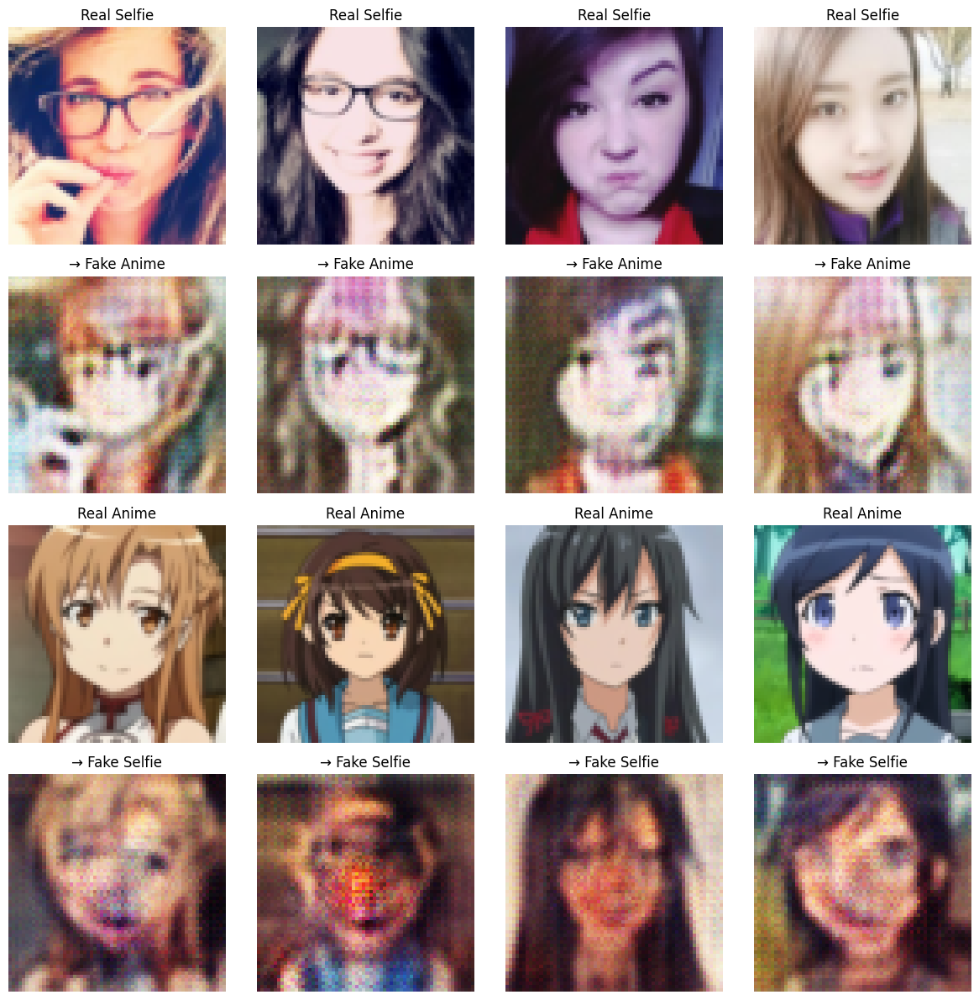

Epoch 2/100: 100%|██████████| 850/850 [02:49<00:00,  5.02it/s, G=3.3004, D_A=0.1486, D_B=0.1146]


Epoch [2/100]
  Generator Loss: 3.6972
  Discriminator Loss: 0.1968
  Identity Loss: 0.1925
  Cycle Loss: 0.2199
  GAN Loss: 0.5357
  Learning Rate: 0.000200
Models saved at epoch 2


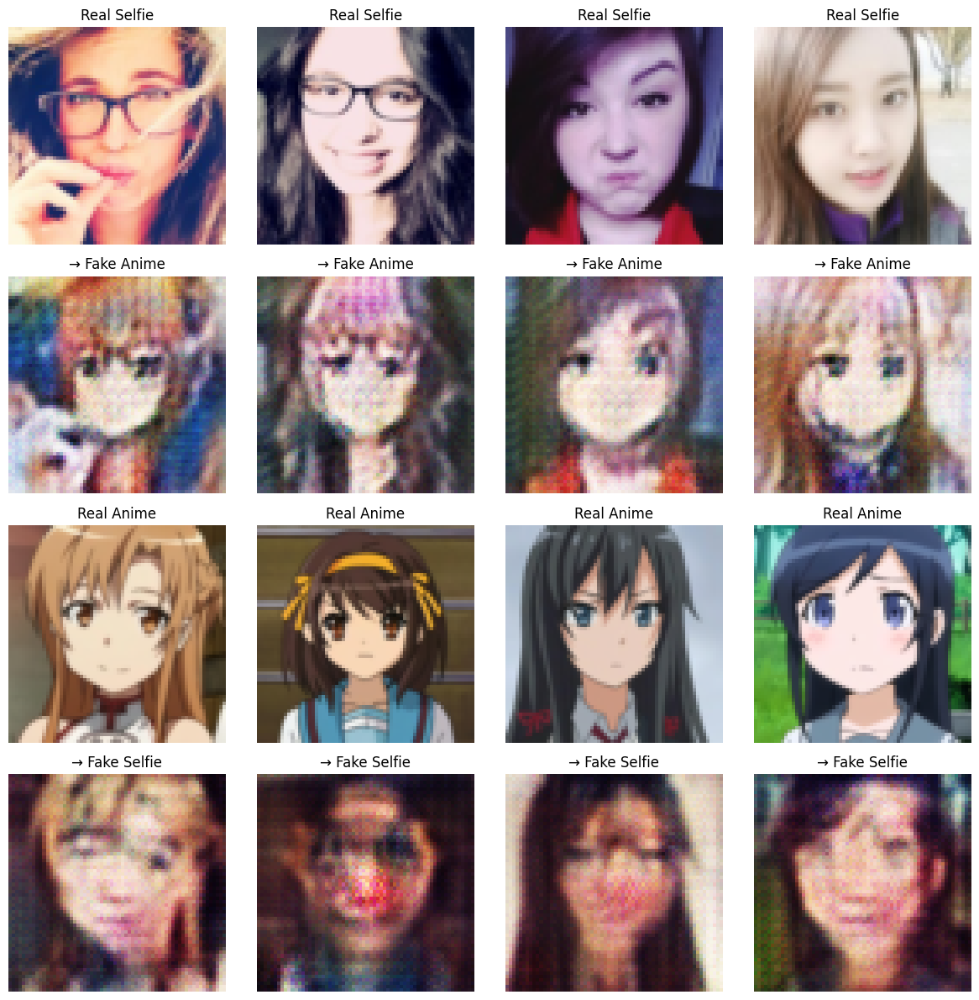

Epoch 3/100: 100%|██████████| 850/850 [02:50<00:00,  4.98it/s, G=3.0689, D_A=0.2171, D_B=0.2910]

Epoch [3/100]
  Generator Loss: 3.5830
  Discriminator Loss: 0.1740
  Identity Loss: 0.1799
  Cycle Loss: 0.2109
  GAN Loss: 0.5745
  Learning Rate: 0.000200


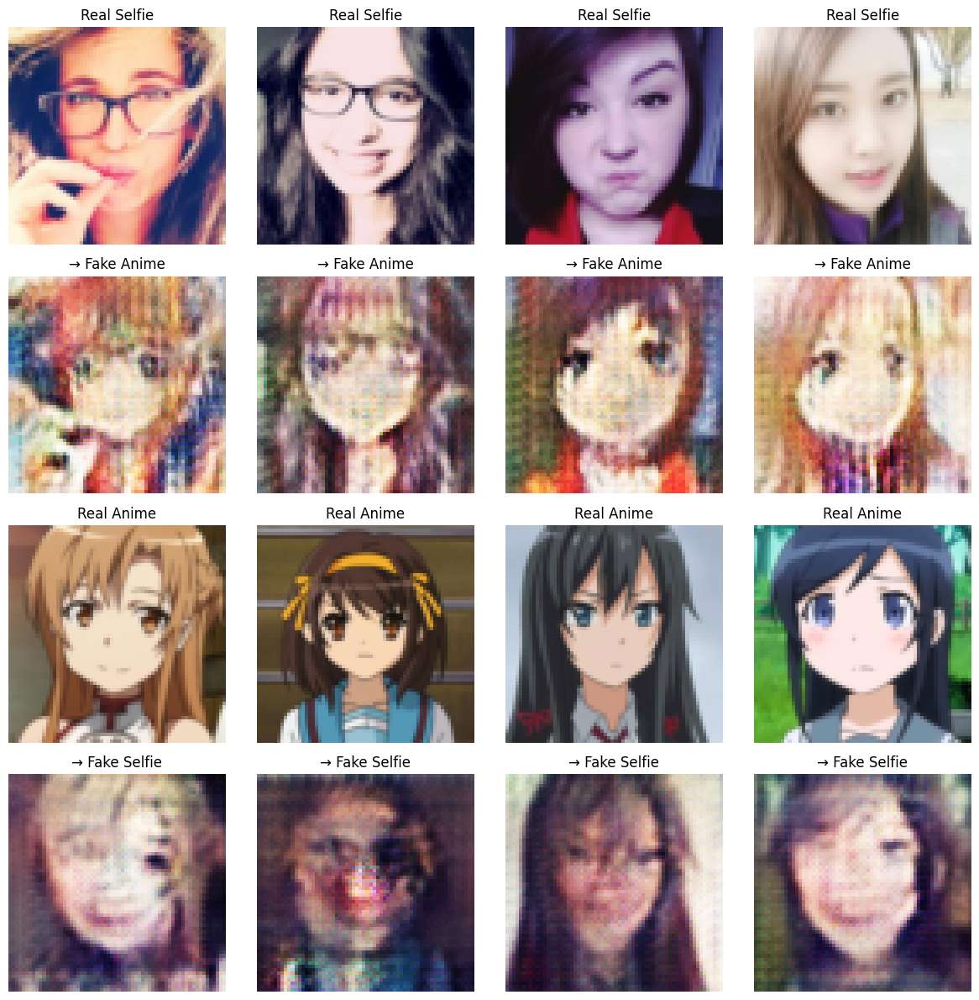

Epoch 4/100: 100%|██████████| 850/850 [02:51<00:00,  4.94it/s, G=3.3406, D_A=0.2263, D_B=0.2575]


Epoch [4/100]
  Generator Loss: 3.5059
  Discriminator Loss: 0.1572
  Identity Loss: 0.1708
  Cycle Loss: 0.2034
  GAN Loss: 0.6178
  Learning Rate: 0.000200
Models saved at epoch 4


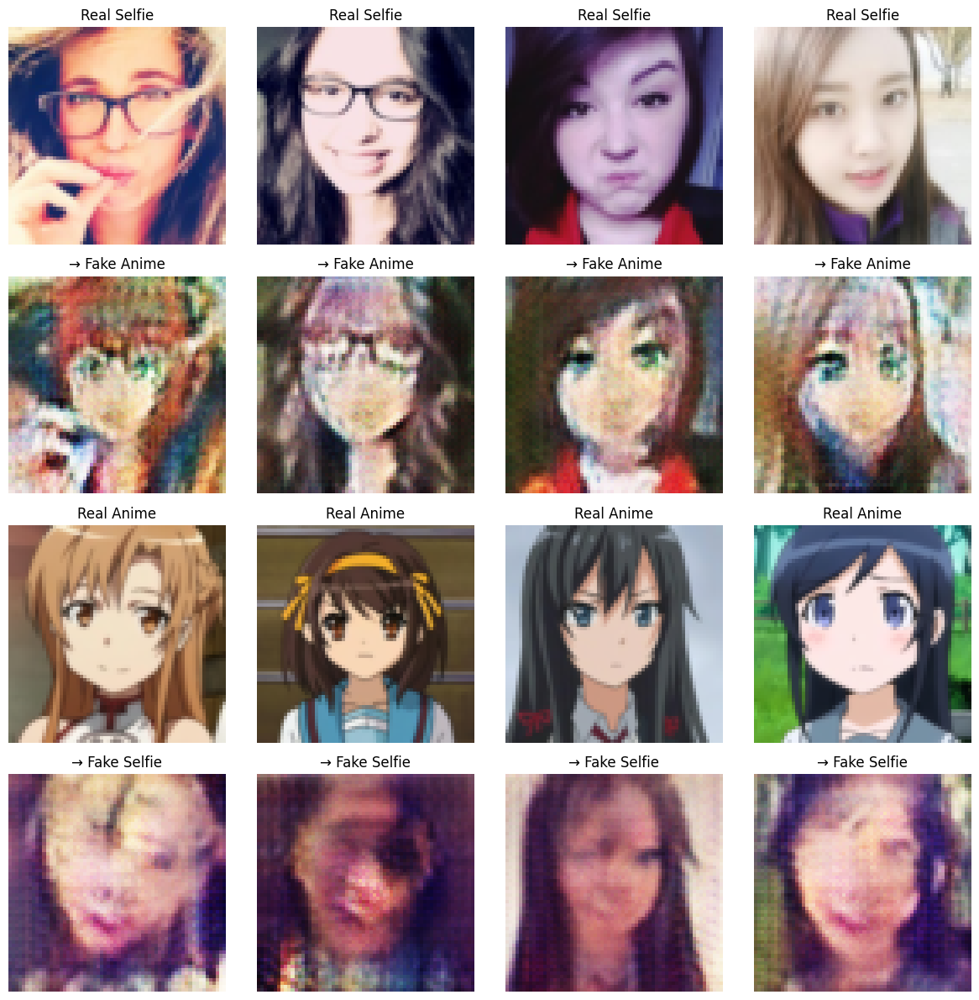

Epoch 5/100: 100%|██████████| 850/850 [02:52<00:00,  4.92it/s, G=3.5416, D_A=0.0816, D_B=0.1952]

Epoch [5/100]
  Generator Loss: 3.4542
  Discriminator Loss: 0.1430
  Identity Loss: 0.1648
  Cycle Loss: 0.1987
  GAN Loss: 0.6434
  Learning Rate: 0.000100


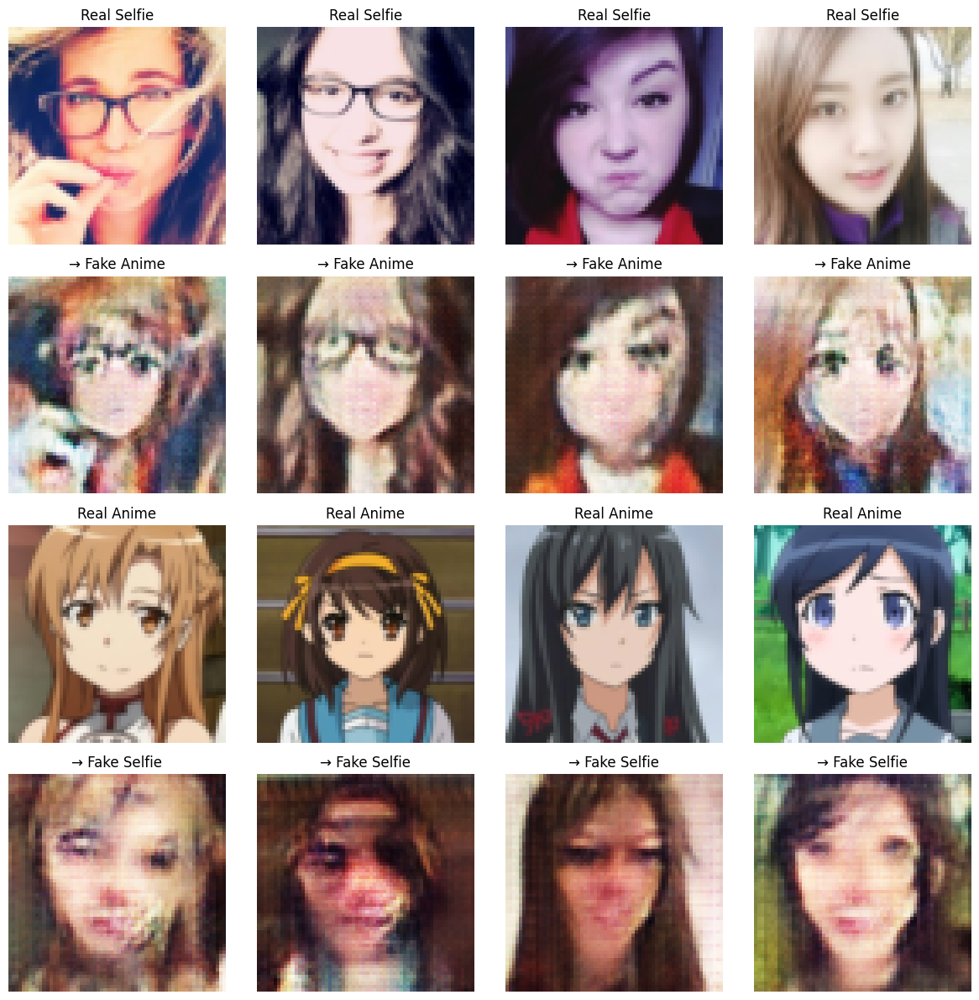

Epoch 6/100: 100%|██████████| 850/850 [02:53<00:00,  4.90it/s, G=3.0189, D_A=0.1385, D_B=0.0877]


Epoch [6/100]
  Generator Loss: 3.2046
  Discriminator Loss: 0.1123
  Identity Loss: 0.1493
  Cycle Loss: 0.1802
  GAN Loss: 0.6561
  Learning Rate: 0.000100
Models saved at epoch 6


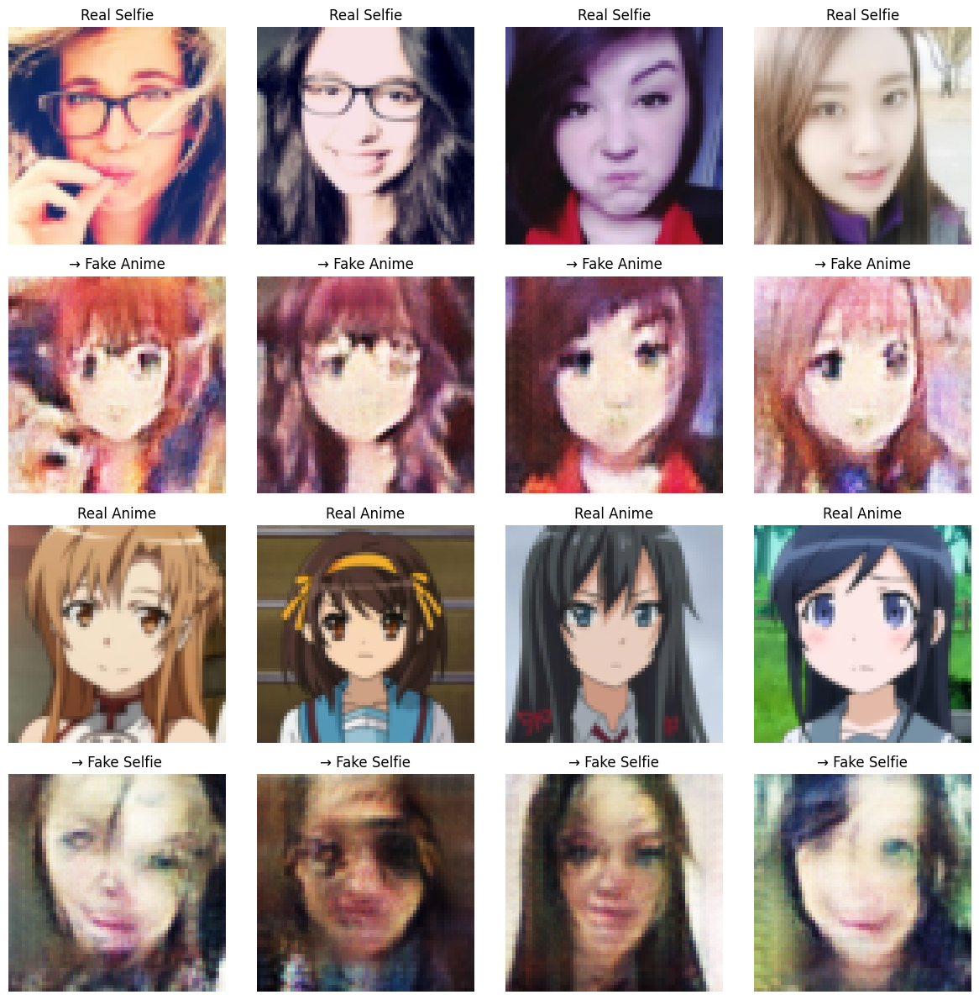

Epoch 7/100: 100%|██████████| 850/850 [02:54<00:00,  4.86it/s, G=3.4088, D_A=0.0693, D_B=0.0867]

Epoch [7/100]
  Generator Loss: 3.1908
  Discriminator Loss: 0.1073
  Identity Loss: 0.1457
  Cycle Loss: 0.1778
  GAN Loss: 0.6849
  Learning Rate: 0.000100


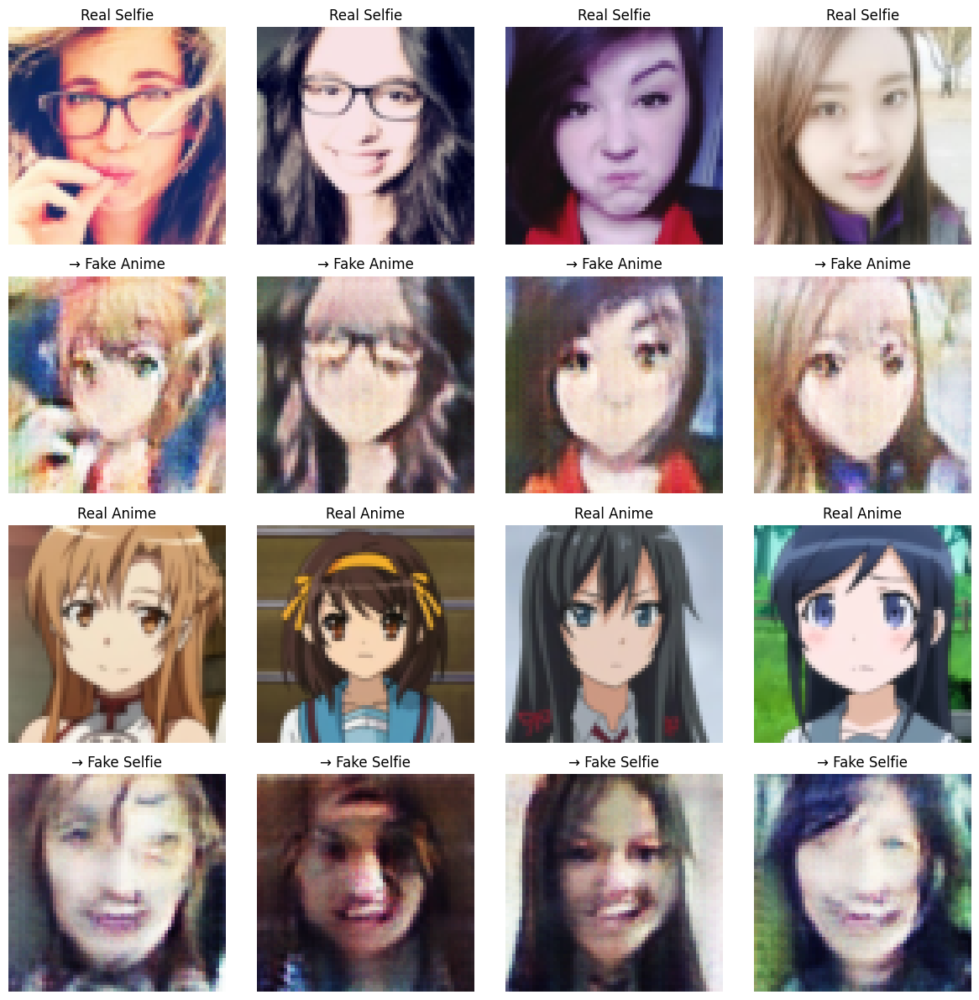

Epoch 8/100: 100%|██████████| 850/850 [02:55<00:00,  4.85it/s, G=2.7095, D_A=0.1308, D_B=0.1311]


Epoch [8/100]
  Generator Loss: 3.1707
  Discriminator Loss: 0.1027
  Identity Loss: 0.1426
  Cycle Loss: 0.1756
  GAN Loss: 0.7013
  Learning Rate: 0.000100
Models saved at epoch 8


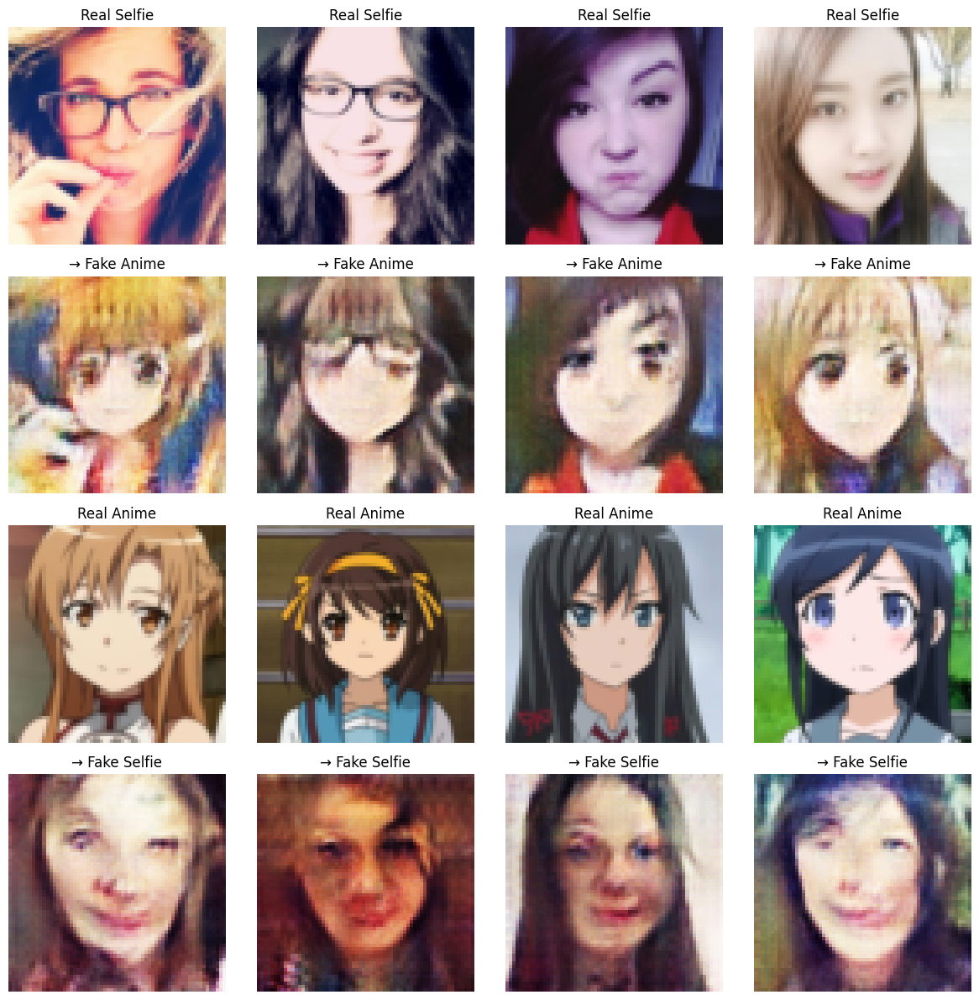

Epoch 9/100: 100%|██████████| 850/850 [02:55<00:00,  4.85it/s, G=2.9152, D_A=0.1485, D_B=0.2343]

Epoch [9/100]
  Generator Loss: 3.1419
  Discriminator Loss: 0.0964
  Identity Loss: 0.1395
  Cycle Loss: 0.1725
  GAN Loss: 0.7197
  Learning Rate: 0.000100


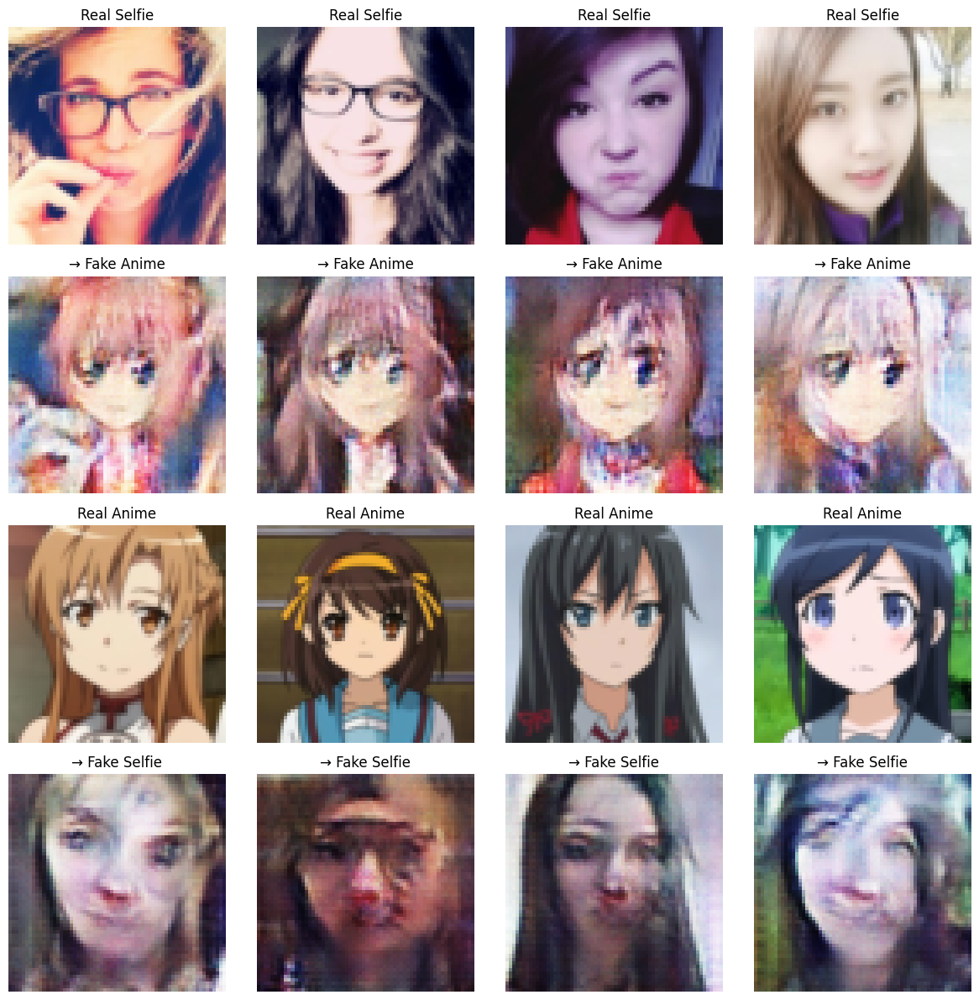

Epoch 10/100: 100%|██████████| 850/850 [02:55<00:00,  4.84it/s, G=2.9827, D_A=0.1375, D_B=0.0861]


Epoch [10/100]
  Generator Loss: 3.1413
  Discriminator Loss: 0.0898
  Identity Loss: 0.1376
  Cycle Loss: 0.1709
  GAN Loss: 0.7444
  Learning Rate: 0.000050
Models saved at epoch 10


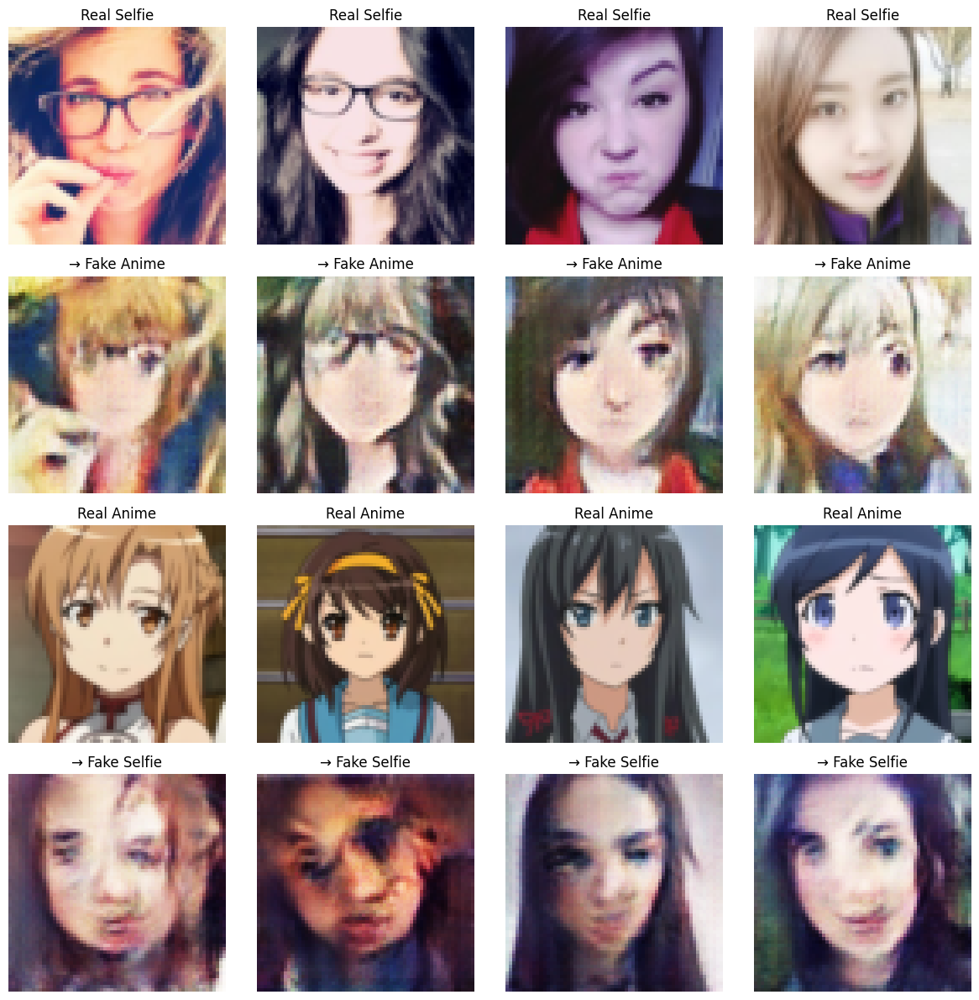

Epoch 11/100: 100%|██████████| 850/850 [02:56<00:00,  4.82it/s, G=2.9285, D_A=0.0437, D_B=0.0590]

Epoch [11/100]
  Generator Loss: 2.9761
  Discriminator Loss: 0.0691
  Identity Loss: 0.1280
  Cycle Loss: 0.1576
  GAN Loss: 0.7595
  Learning Rate: 0.000050


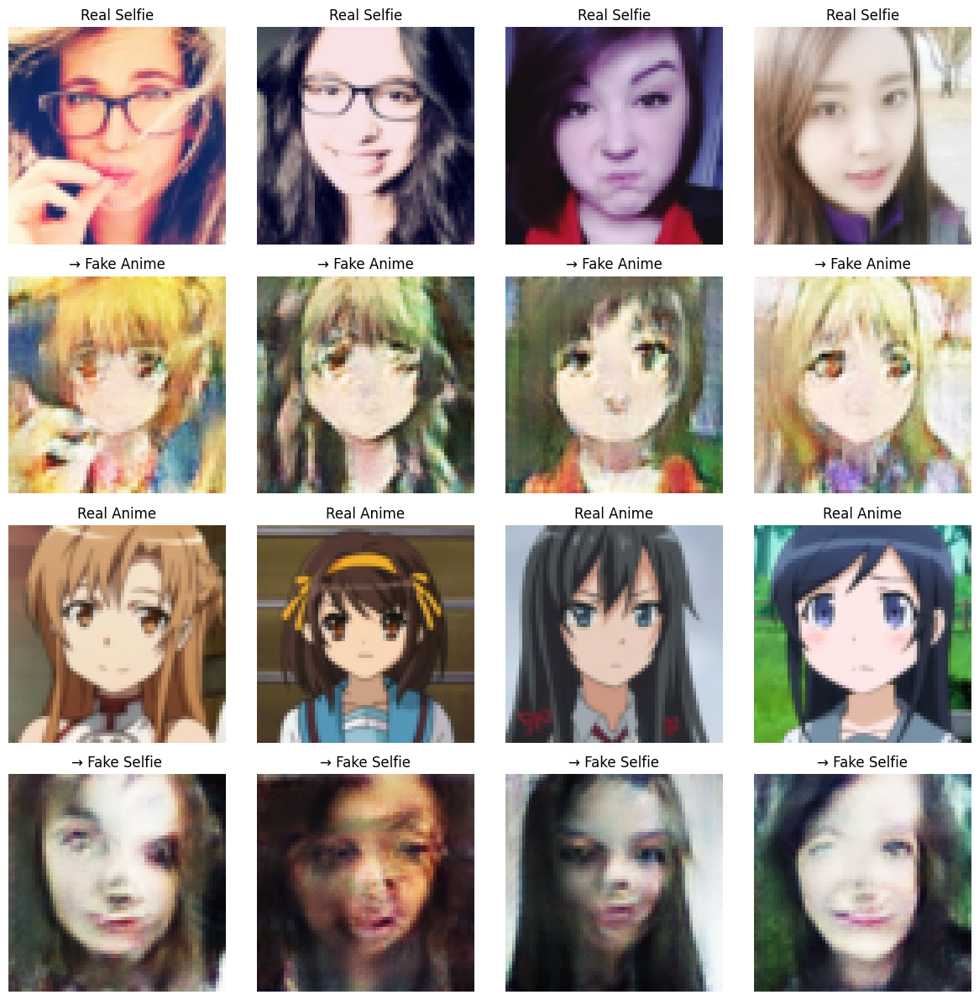

Epoch 12/100: 100%|██████████| 850/850 [02:55<00:00,  4.85it/s, G=2.6919, D_A=0.0638, D_B=0.0370]


Epoch [12/100]
  Generator Loss: 2.9776
  Discriminator Loss: 0.0658
  Identity Loss: 0.1261
  Cycle Loss: 0.1568
  GAN Loss: 0.7788
  Learning Rate: 0.000050
Models saved at epoch 12


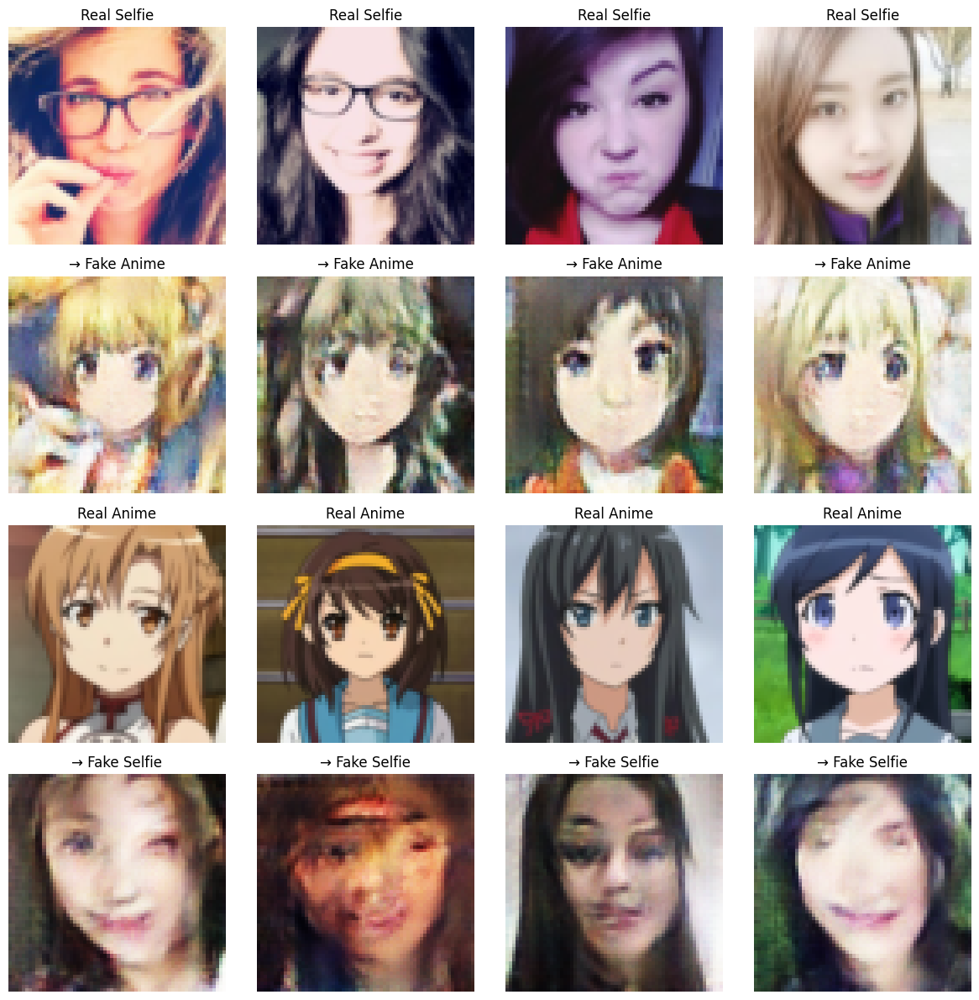

Epoch 13/100: 100%|██████████| 850/850 [02:55<00:00,  4.84it/s, G=3.1174, D_A=0.0376, D_B=0.0892]

Epoch [13/100]
  Generator Loss: 2.9664
  Discriminator Loss: 0.0620
  Identity Loss: 0.1247
  Cycle Loss: 0.1548
  GAN Loss: 0.7955
  Learning Rate: 0.000050


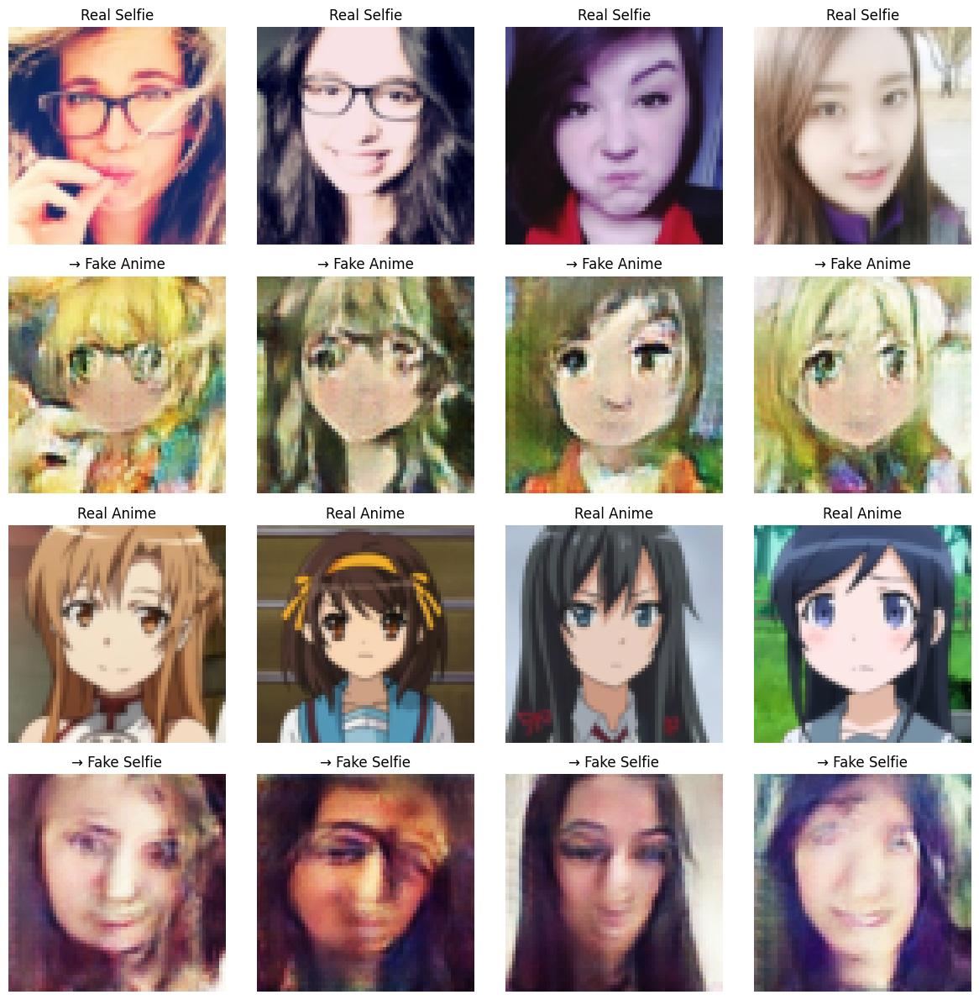

Epoch 14/100: 100%|██████████| 850/850 [02:56<00:00,  4.82it/s, G=2.5844, D_A=0.0654, D_B=0.0617]


Epoch [14/100]
  Generator Loss: 2.9602
  Discriminator Loss: 0.0598
  Identity Loss: 0.1236
  Cycle Loss: 0.1537
  GAN Loss: 0.8056
  Learning Rate: 0.000050
Models saved at epoch 14


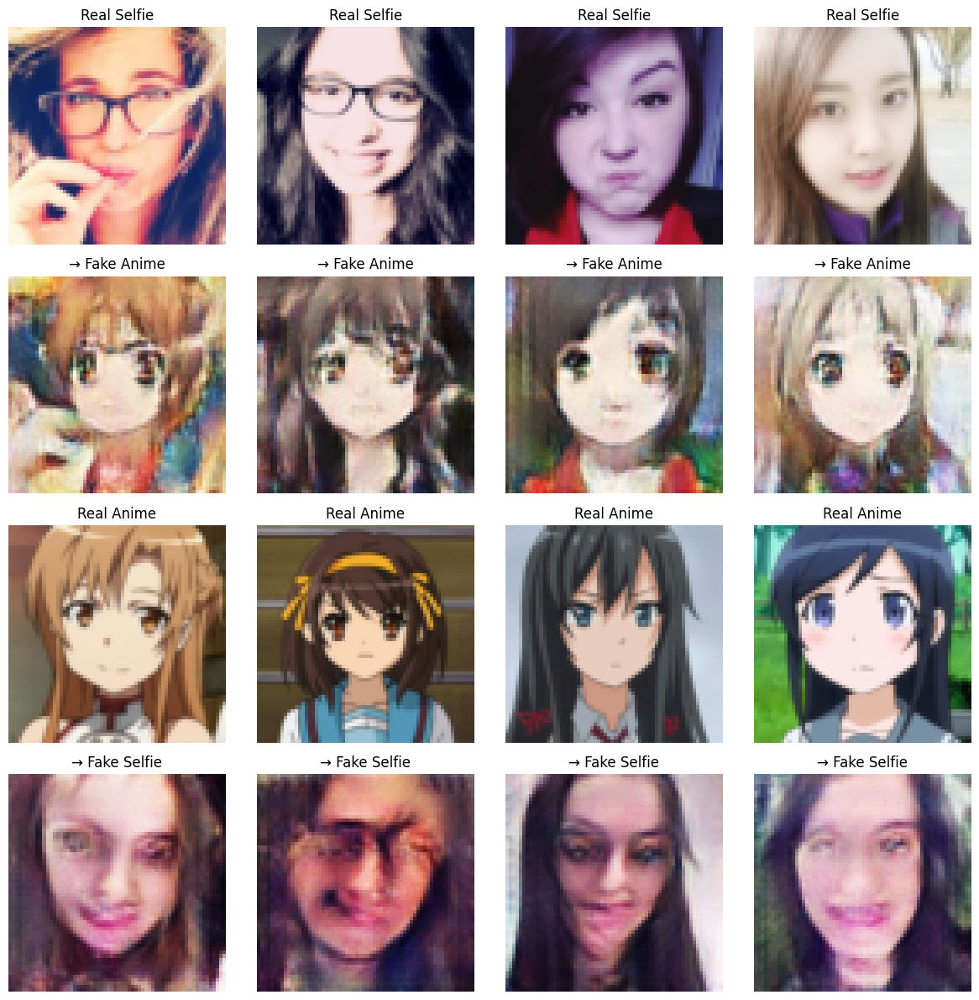

Epoch 15/100: 100%|██████████| 850/850 [02:57<00:00,  4.80it/s, G=2.6366, D_A=0.0567, D_B=0.0233]

Epoch [15/100]
  Generator Loss: 2.9405
  Discriminator Loss: 0.0576
  Identity Loss: 0.1217
  Cycle Loss: 0.1519
  GAN Loss: 0.8130
  Learning Rate: 0.000025


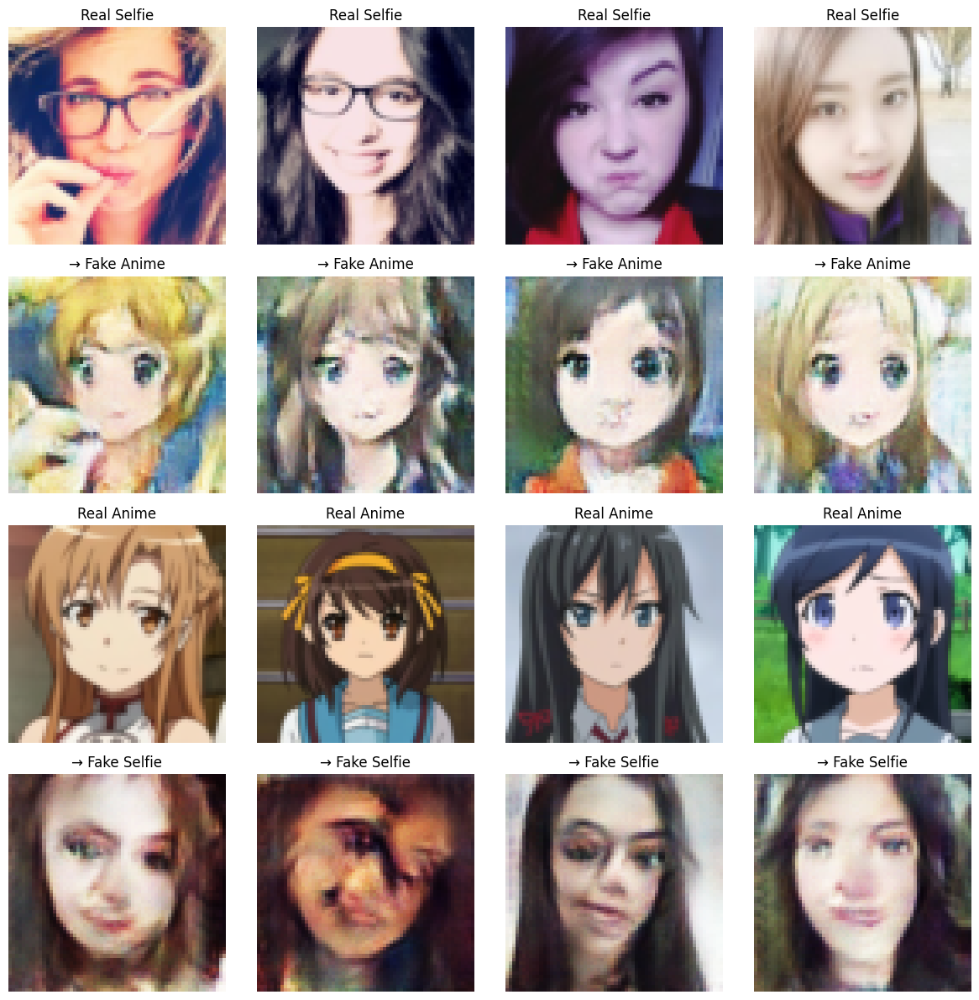

Epoch 16/100: 100%|██████████| 850/850 [02:56<00:00,  4.83it/s, G=3.0101, D_A=0.0911, D_B=0.0129]


Epoch [16/100]
  Generator Loss: 2.8307
  Discriminator Loss: 0.0450
  Identity Loss: 0.1162
  Cycle Loss: 0.1430
  GAN Loss: 0.8192
  Learning Rate: 0.000025
Models saved at epoch 16


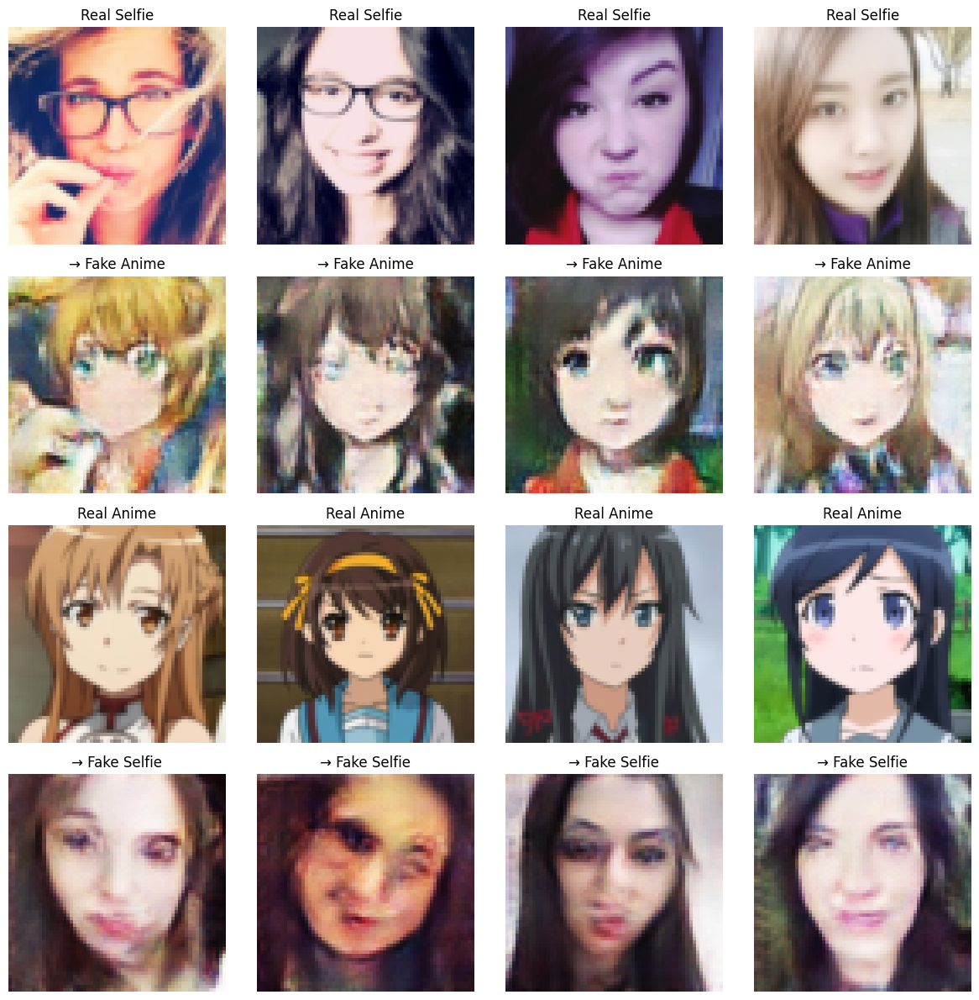

Epoch 17/100: 100%|██████████| 850/850 [02:55<00:00,  4.83it/s, G=2.7735, D_A=0.0443, D_B=0.0317]

Epoch [17/100]
  Generator Loss: 2.8256
  Discriminator Loss: 0.0410
  Identity Loss: 0.1155
  Cycle Loss: 0.1420
  GAN Loss: 0.8284
  Learning Rate: 0.000025


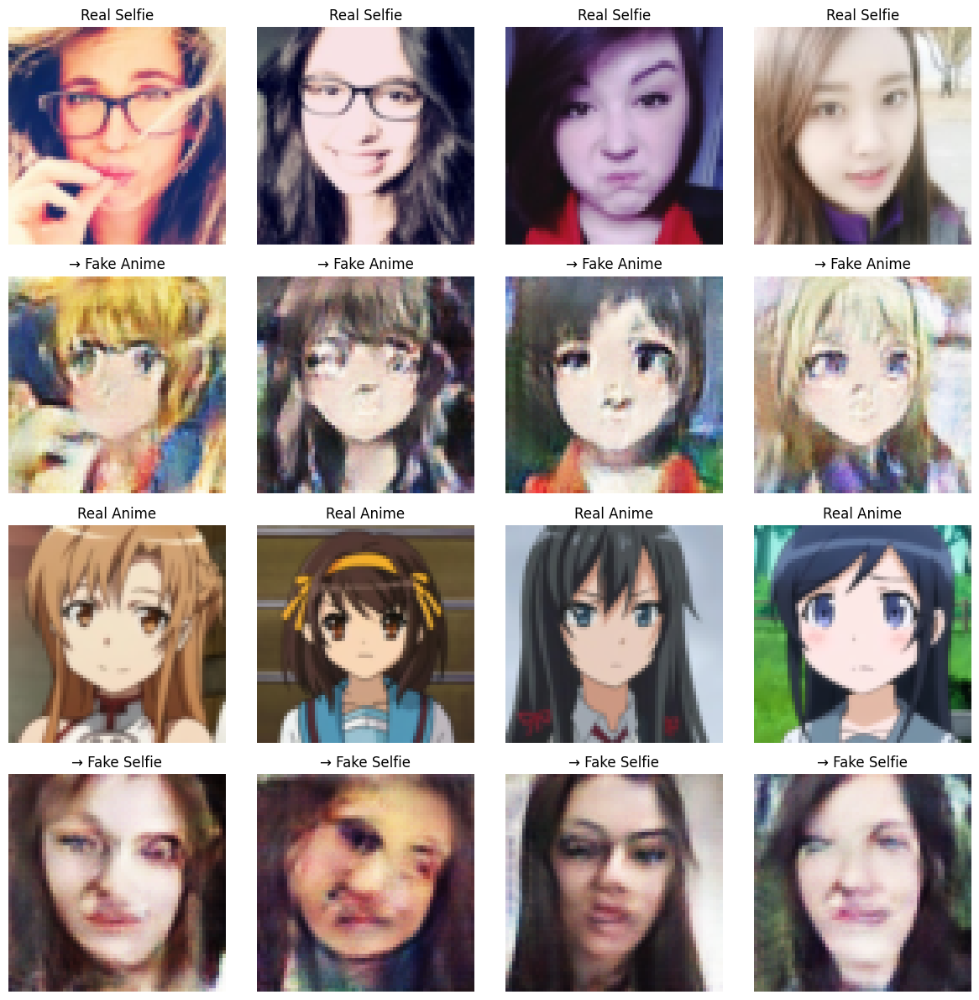

Epoch 18/100: 100%|██████████| 850/850 [02:56<00:00,  4.83it/s, G=2.7862, D_A=0.0342, D_B=0.0193]


Epoch [18/100]
  Generator Loss: 2.8196
  Discriminator Loss: 0.0400
  Identity Loss: 0.1143
  Cycle Loss: 0.1411
  GAN Loss: 0.8368
  Learning Rate: 0.000025
Models saved at epoch 18


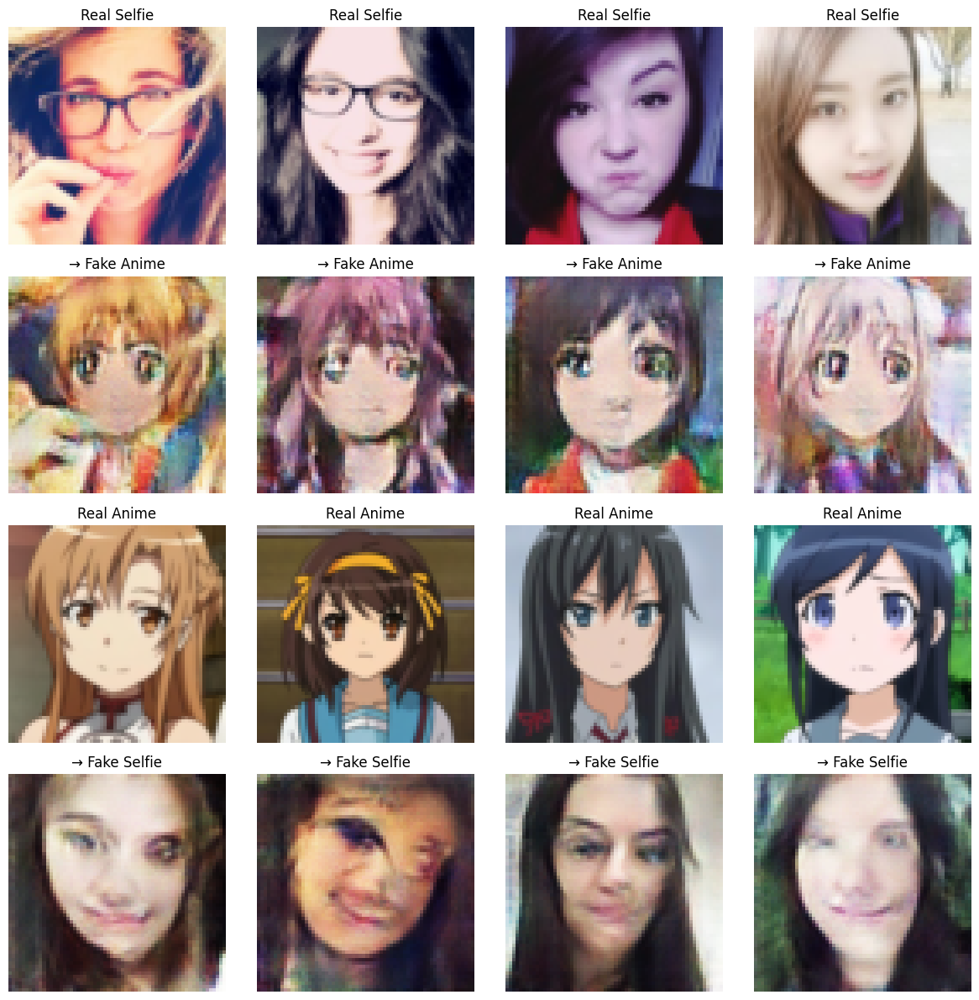

Epoch 19/100: 100%|██████████| 850/850 [02:56<00:00,  4.83it/s, G=2.6942, D_A=0.0515, D_B=0.0345]

Epoch [19/100]
  Generator Loss: 2.8098
  Discriminator Loss: 0.0385
  Identity Loss: 0.1136
  Cycle Loss: 0.1403
  GAN Loss: 0.8382
  Learning Rate: 0.000025


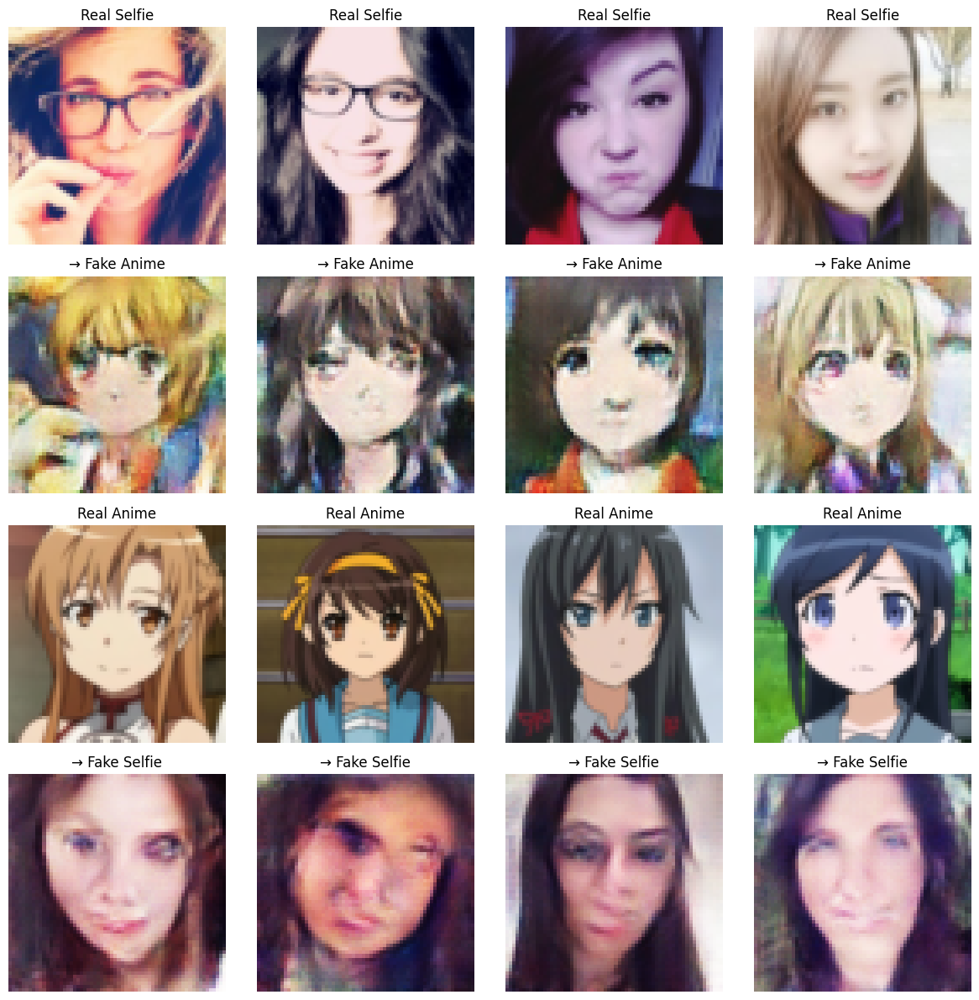

Epoch 20/100: 100%|██████████| 850/850 [02:56<00:00,  4.81it/s, G=2.7515, D_A=0.0220, D_B=0.0346]


Epoch [20/100]
  Generator Loss: 2.8080
  Discriminator Loss: 0.0375
  Identity Loss: 0.1128
  Cycle Loss: 0.1396
  GAN Loss: 0.8482
  Learning Rate: 0.000013
Models saved at epoch 20


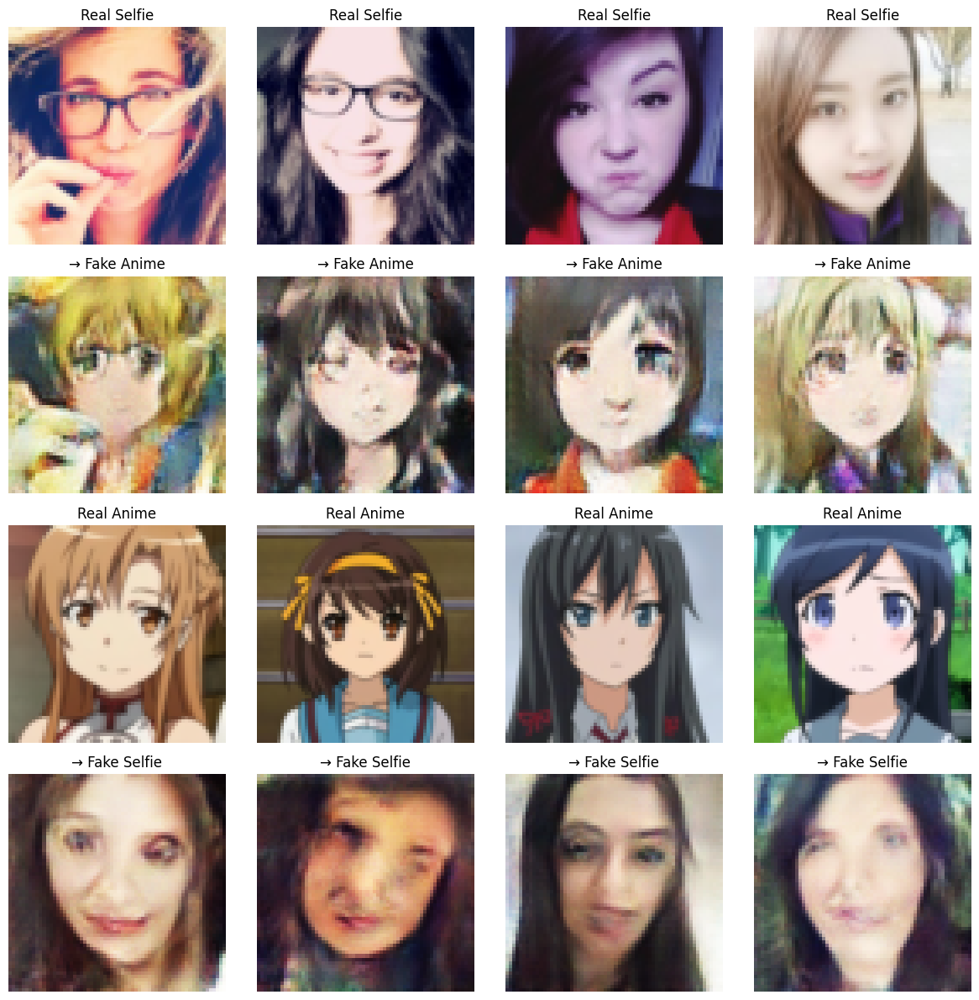

Epoch 21/100: 100%|██████████| 850/850 [02:56<00:00,  4.82it/s, G=2.7031, D_A=0.0333, D_B=0.0318]

Epoch [21/100]
  Generator Loss: 2.7293
  Discriminator Loss: 0.0318
  Identity Loss: 0.1104
  Cycle Loss: 0.1348
  GAN Loss: 0.8289
  Learning Rate: 0.000013


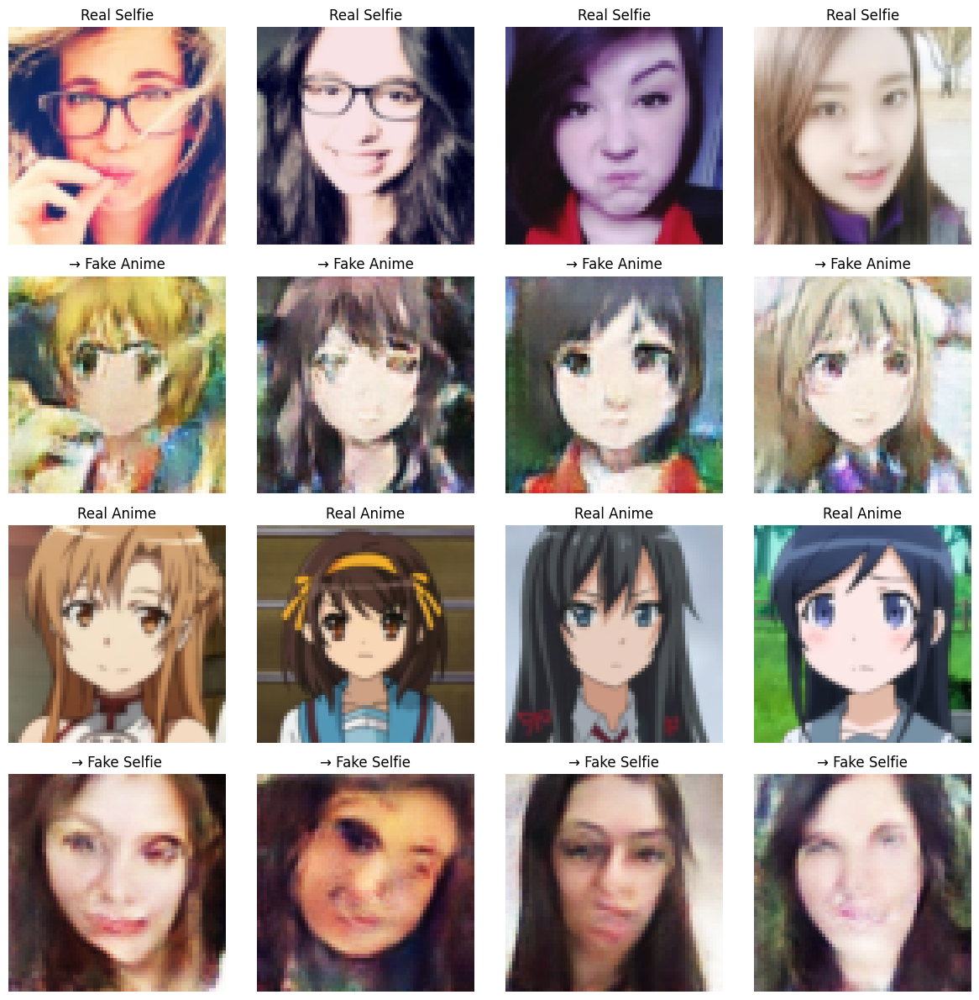

Epoch 22/100: 100%|██████████| 850/850 [02:56<00:00,  4.82it/s, G=3.1070, D_A=0.0331, D_B=0.0100]


Epoch [22/100]
  Generator Loss: 2.7213
  Discriminator Loss: 0.0287
  Identity Loss: 0.1100
  Cycle Loss: 0.1338
  GAN Loss: 0.8334
  Learning Rate: 0.000013
Models saved at epoch 22


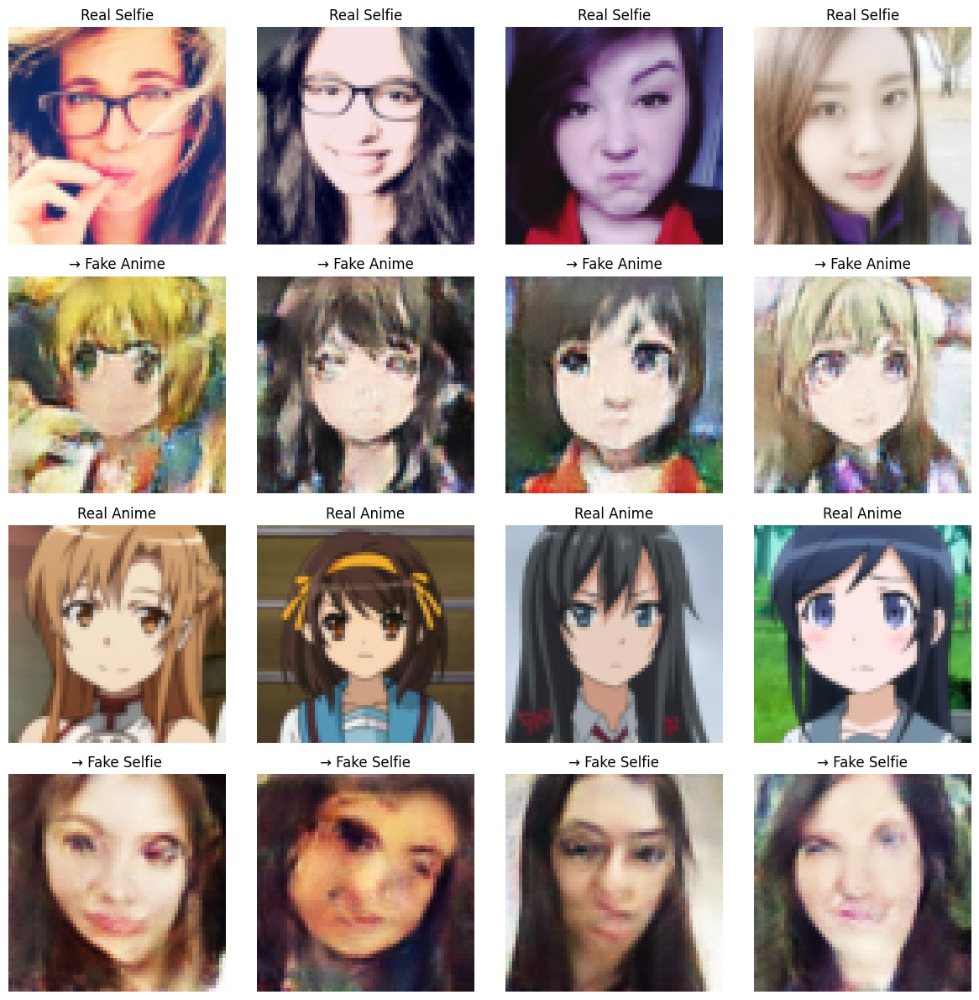

Epoch 23/100: 100%|██████████| 850/850 [02:56<00:00,  4.82it/s, G=2.4950, D_A=0.0292, D_B=0.0186]

Epoch [23/100]
  Generator Loss: 2.7187
  Discriminator Loss: 0.0270
  Identity Loss: 0.1095
  Cycle Loss: 0.1335
  GAN Loss: 0.8368
  Learning Rate: 0.000013


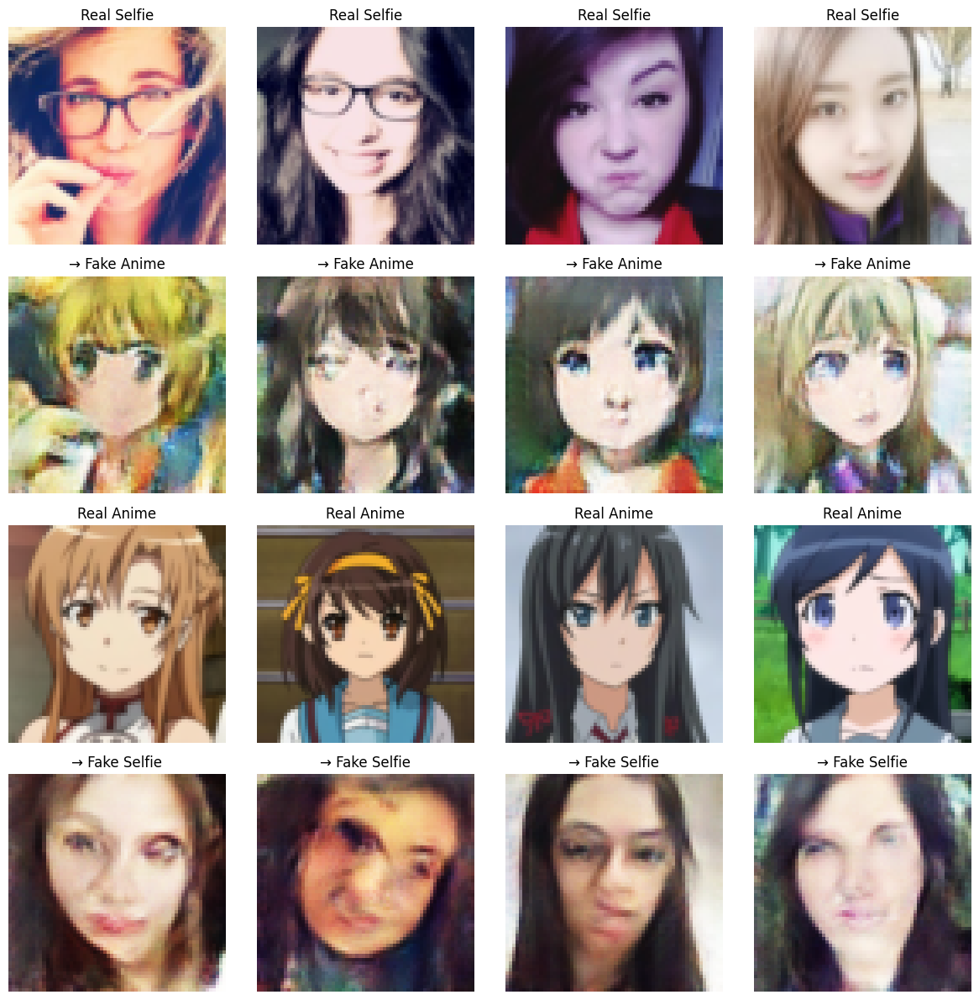

Epoch 24/100: 100%|██████████| 850/850 [02:57<00:00,  4.79it/s, G=2.8141, D_A=0.0108, D_B=0.0083]


Epoch [24/100]
  Generator Loss: 2.7198
  Discriminator Loss: 0.0257
  Identity Loss: 0.1092
  Cycle Loss: 0.1332
  GAN Loss: 0.8424
  Learning Rate: 0.000013
Models saved at epoch 24


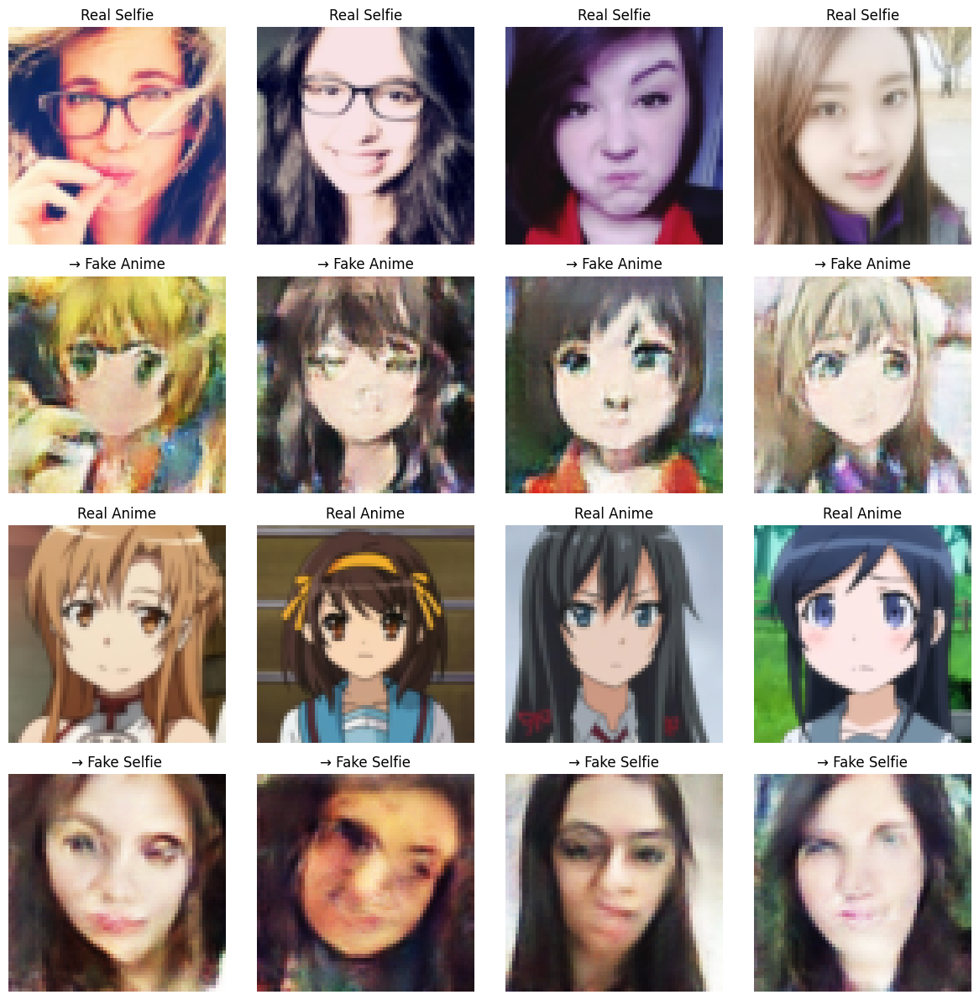

Epoch 25/100: 100%|██████████| 850/850 [02:56<00:00,  4.80it/s, G=2.5410, D_A=0.0419, D_B=0.0111]

Epoch [25/100]
  Generator Loss: 2.7215
  Discriminator Loss: 0.0247
  Identity Loss: 0.1089
  Cycle Loss: 0.1331
  GAN Loss: 0.8462
  Learning Rate: 0.000006


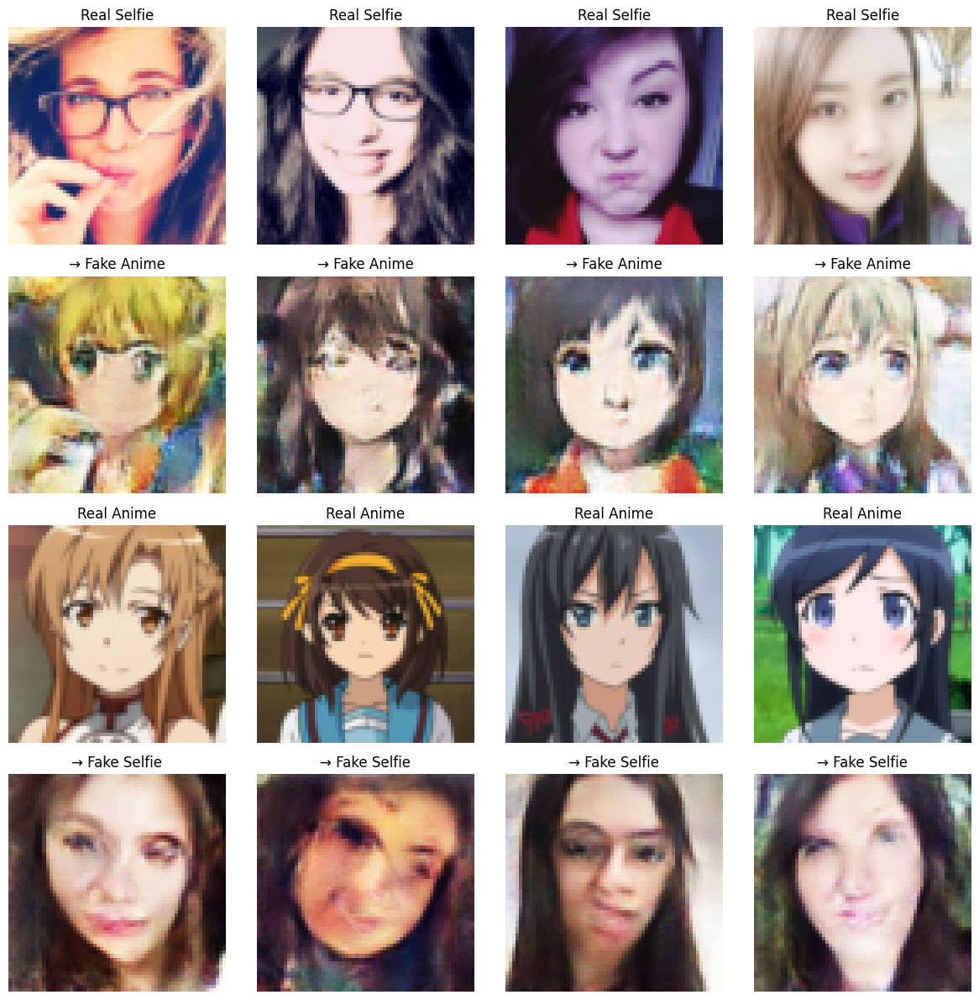

Epoch 26/100: 100%|██████████| 850/850 [02:58<00:00,  4.77it/s, G=2.6732, D_A=0.0509, D_B=0.0104]


Epoch [26/100]
  Generator Loss: 2.6731
  Discriminator Loss: 0.0230
  Identity Loss: 0.1080
  Cycle Loss: 0.1310
  GAN Loss: 0.8228
  Learning Rate: 0.000006
Models saved at epoch 26


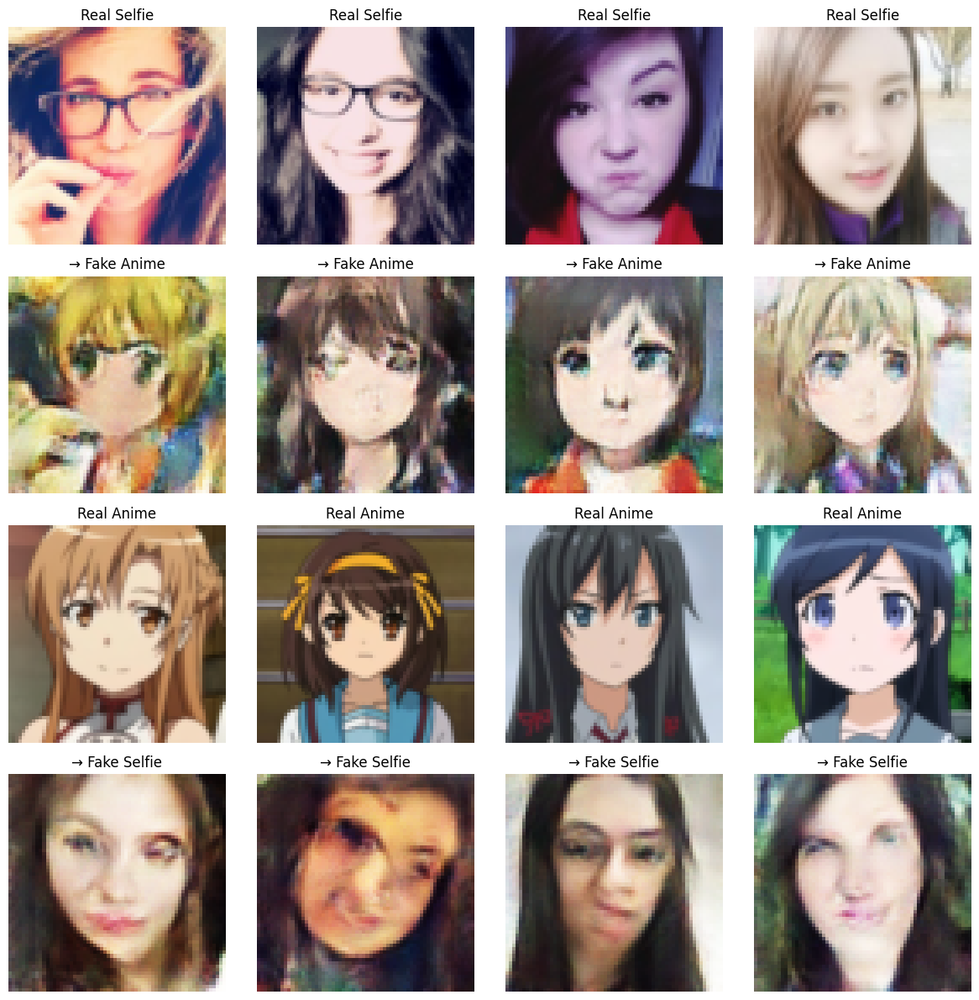

Epoch 27/100: 100%|██████████| 850/850 [02:59<00:00,  4.74it/s, G=3.1111, D_A=0.0238, D_B=0.0105]

Epoch [27/100]
  Generator Loss: 2.6754
  Discriminator Loss: 0.0207
  Identity Loss: 0.1078
  Cycle Loss: 0.1308
  GAN Loss: 0.8288
  Learning Rate: 0.000006


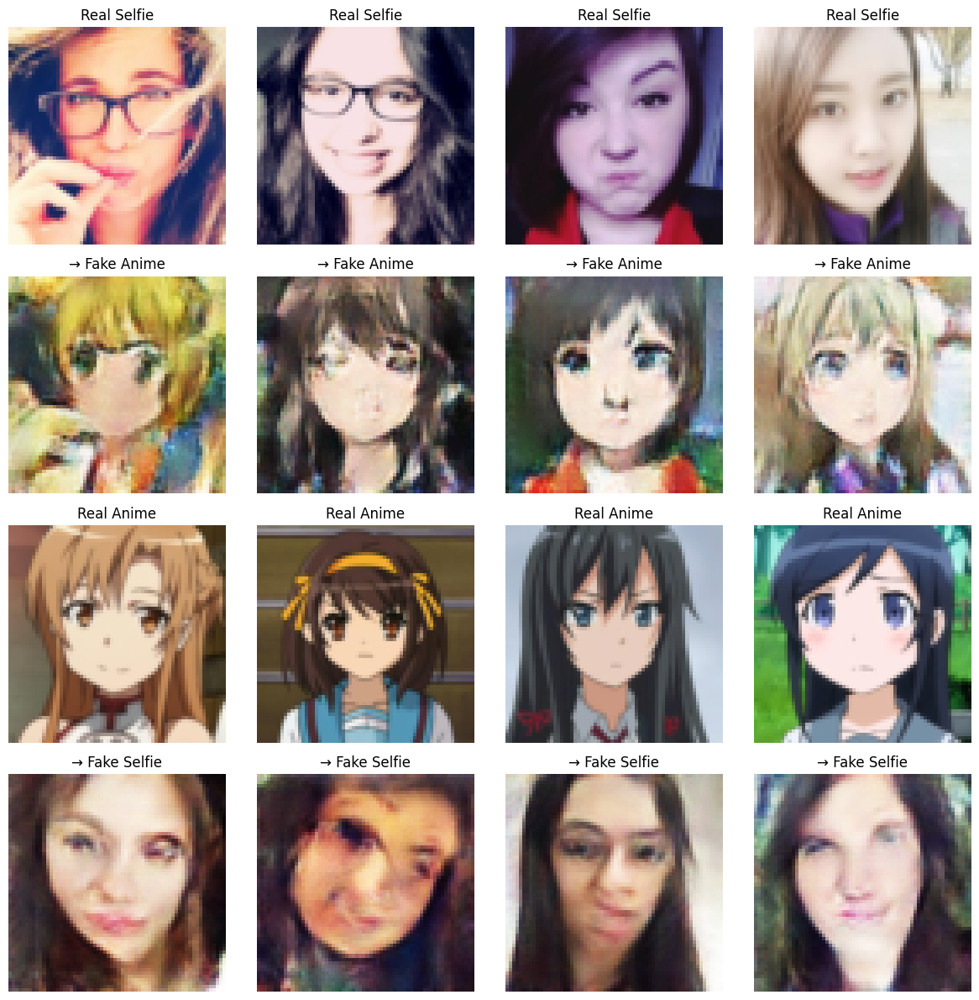

Epoch 28/100: 100%|██████████| 850/850 [02:58<00:00,  4.77it/s, G=2.7814, D_A=0.0336, D_B=0.0083]


Epoch [28/100]
  Generator Loss: 2.6810
  Discriminator Loss: 0.0192
  Identity Loss: 0.1077
  Cycle Loss: 0.1307
  GAN Loss: 0.8354
  Learning Rate: 0.000006
Models saved at epoch 28


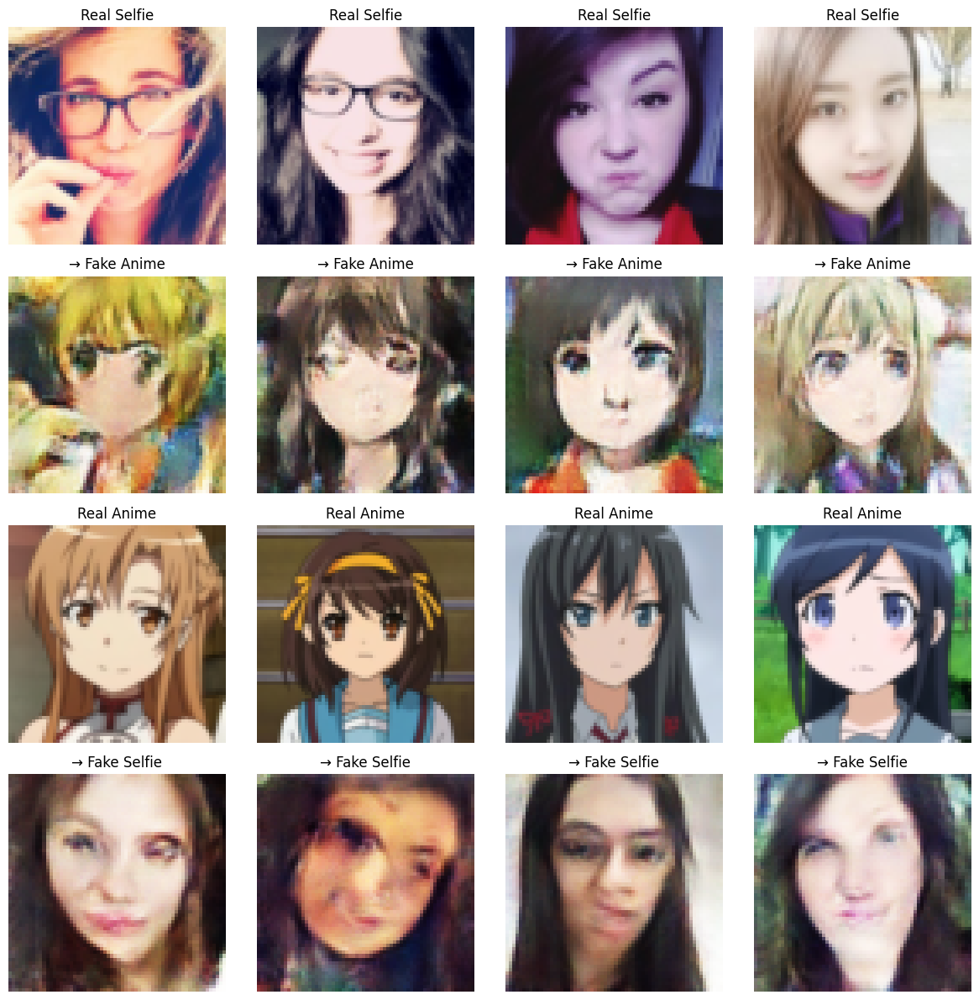

Epoch 29/100: 100%|██████████| 850/850 [02:58<00:00,  4.77it/s, G=2.7395, D_A=0.0235, D_B=0.0082]

Epoch [29/100]
  Generator Loss: 2.6869
  Discriminator Loss: 0.0183
  Identity Loss: 0.1075
  Cycle Loss: 0.1307
  GAN Loss: 0.8422
  Learning Rate: 0.000006


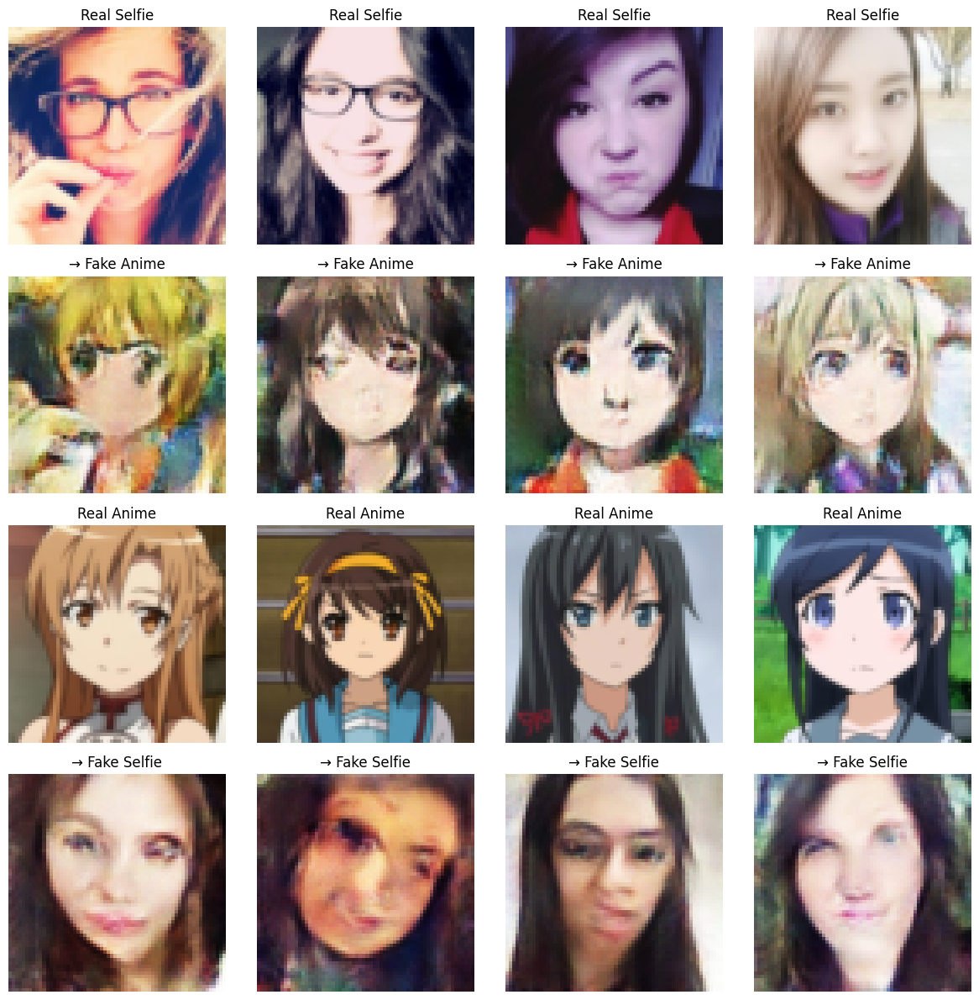

Epoch 30/100: 100%|██████████| 850/850 [02:57<00:00,  4.79it/s, G=2.7753, D_A=0.0230, D_B=0.0081]


Epoch [30/100]
  Generator Loss: 2.6926
  Discriminator Loss: 0.0173
  Identity Loss: 0.1074
  Cycle Loss: 0.1308
  GAN Loss: 0.8477
  Learning Rate: 0.000003
Models saved at epoch 30


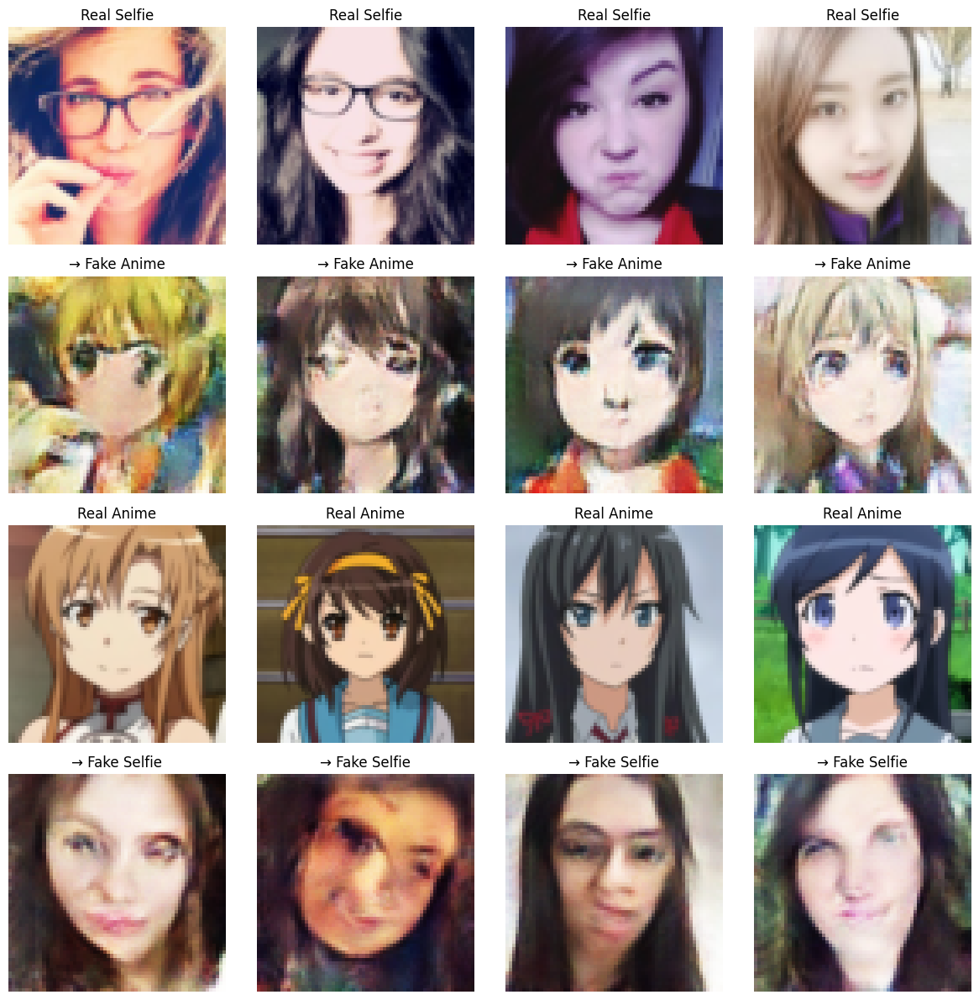

Epoch 31/100: 100%|██████████| 850/850 [02:58<00:00,  4.75it/s, G=2.7266, D_A=0.0242, D_B=0.0153]

Epoch [31/100]
  Generator Loss: 2.6672
  Discriminator Loss: 0.0168
  Identity Loss: 0.1071
  Cycle Loss: 0.1300
  GAN Loss: 0.8316
  Learning Rate: 0.000003


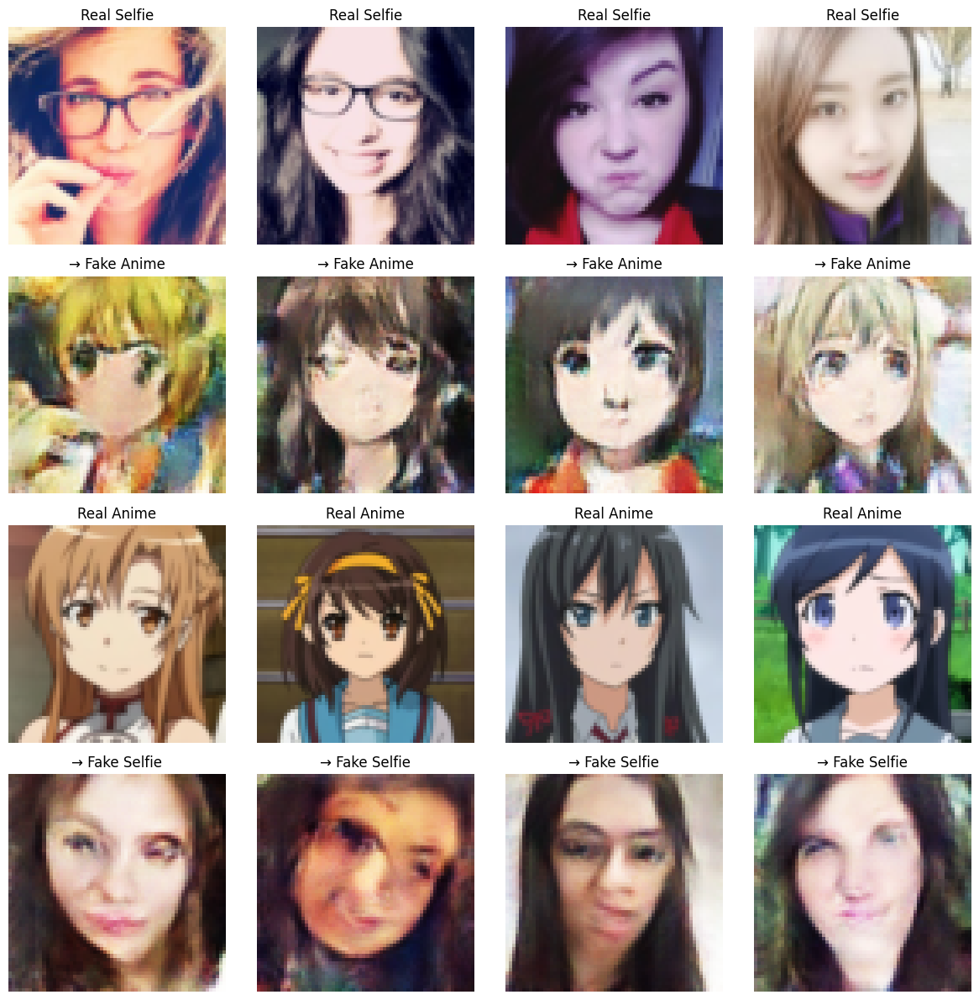

Epoch 32/100: 100%|██████████| 850/850 [02:58<00:00,  4.76it/s, G=2.8060, D_A=0.0171, D_B=0.0117]


Epoch [32/100]
  Generator Loss: 2.6733
  Discriminator Loss: 0.0155
  Identity Loss: 0.1071
  Cycle Loss: 0.1299
  GAN Loss: 0.8387
  Learning Rate: 0.000003
Models saved at epoch 32


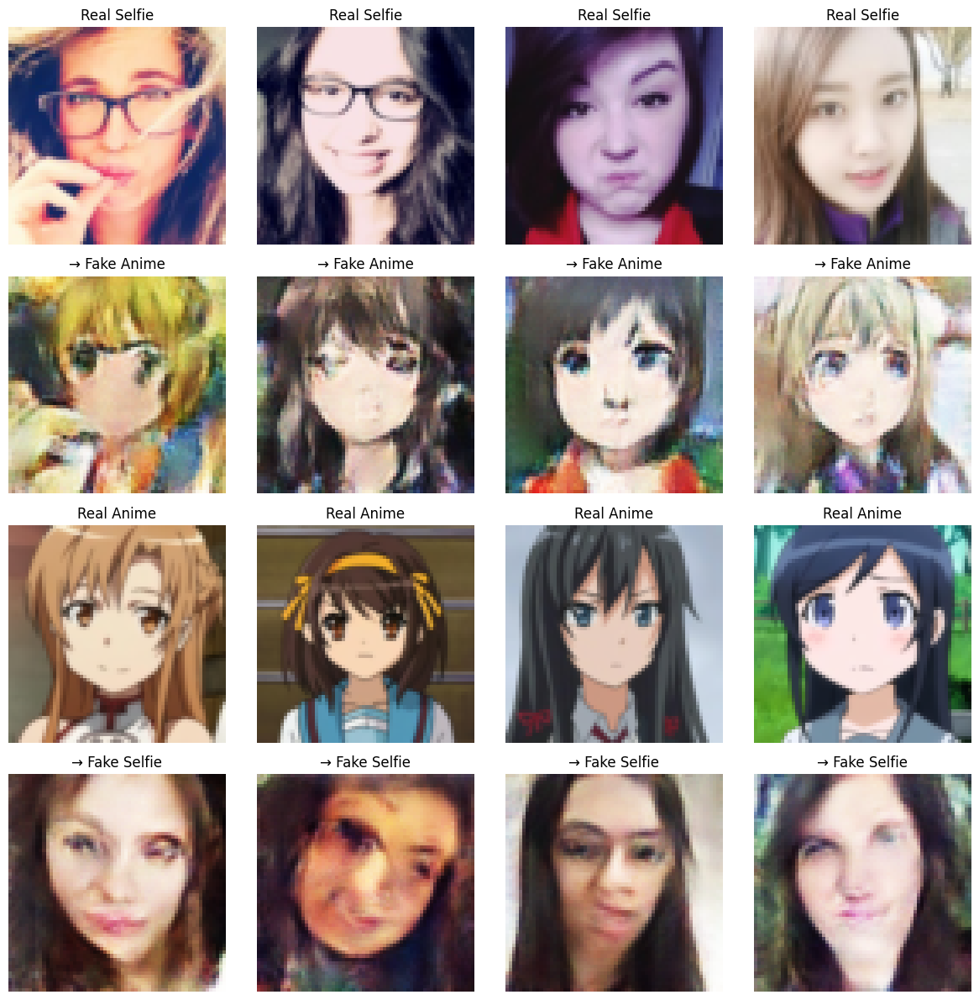

Epoch 33/100: 100%|██████████| 850/850 [02:57<00:00,  4.79it/s, G=2.7701, D_A=0.0228, D_B=0.0078]

Epoch [33/100]
  Generator Loss: 2.6804
  Discriminator Loss: 0.0147
  Identity Loss: 0.1070
  Cycle Loss: 0.1300
  GAN Loss: 0.8454
  Learning Rate: 0.000003


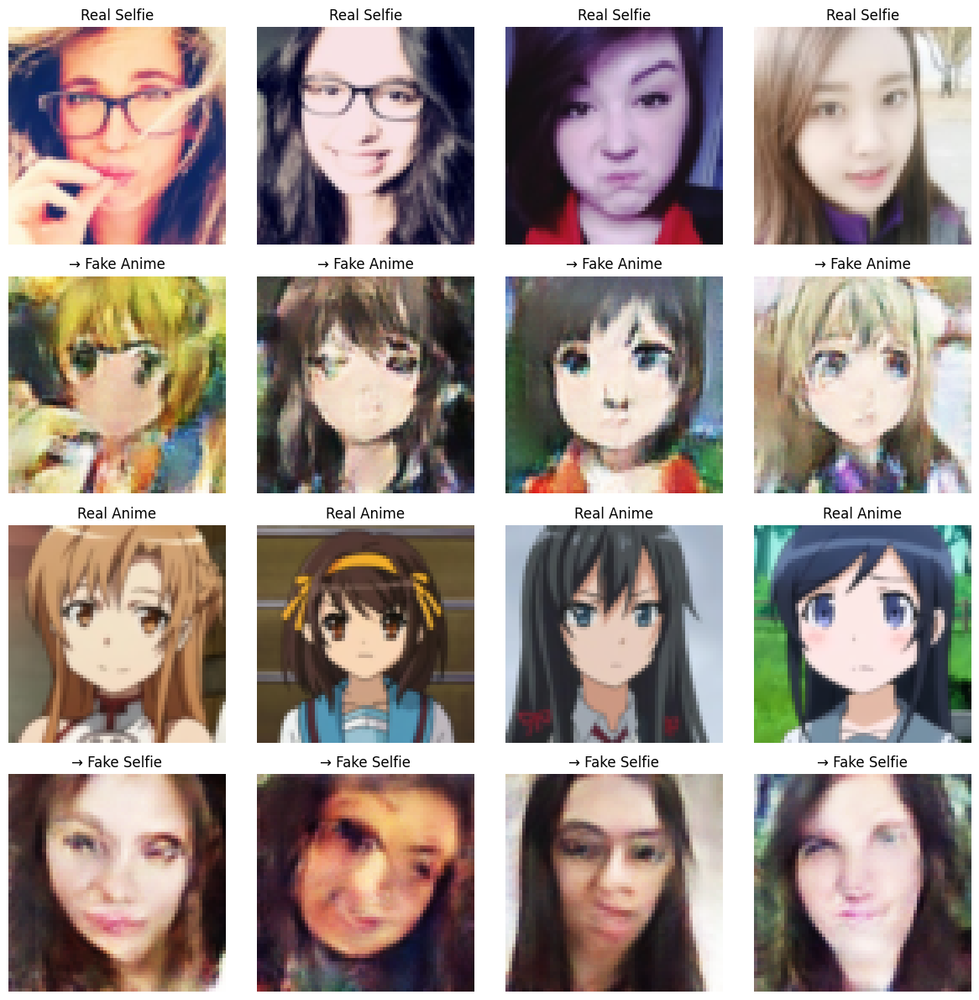

Epoch 34/100: 100%|██████████| 850/850 [02:58<00:00,  4.76it/s, G=2.7477, D_A=0.0153, D_B=0.0073]


Epoch [34/100]
  Generator Loss: 2.6858
  Discriminator Loss: 0.0141
  Identity Loss: 0.1070
  Cycle Loss: 0.1300
  GAN Loss: 0.8508
  Learning Rate: 0.000003
Models saved at epoch 34


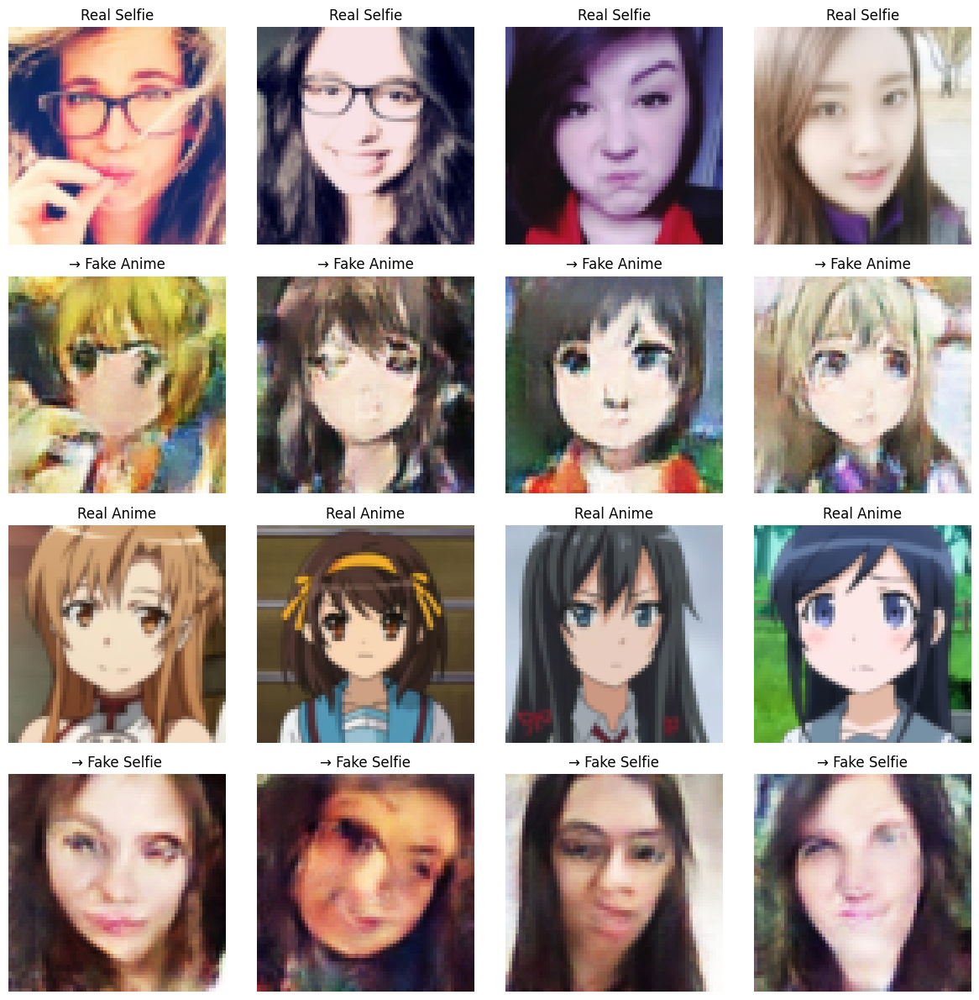

Epoch 35/100: 100%|██████████| 850/850 [02:58<00:00,  4.76it/s, G=2.6332, D_A=0.0175, D_B=0.0099]

Epoch [35/100]
  Generator Loss: 2.6916
  Discriminator Loss: 0.0134
  Identity Loss: 0.1069
  Cycle Loss: 0.1301
  GAN Loss: 0.8562
  Learning Rate: 0.000002


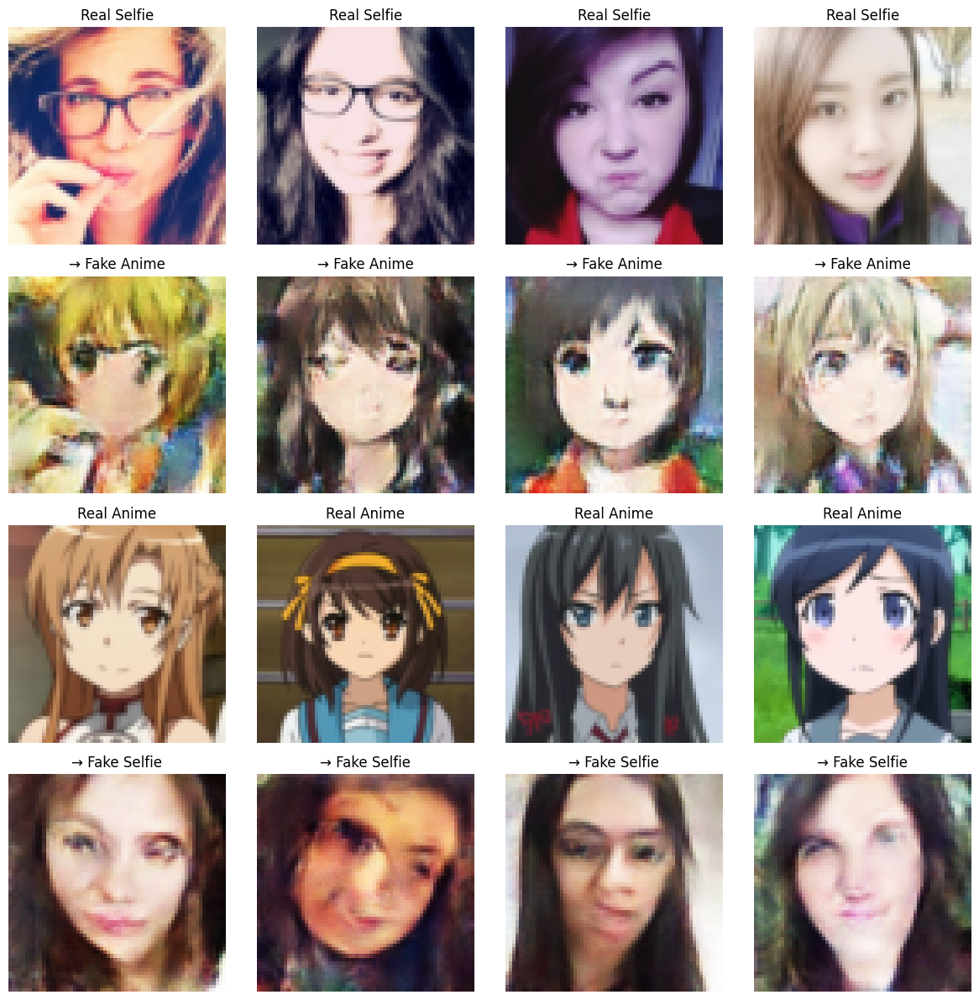

Epoch 36/100: 100%|██████████| 850/850 [02:57<00:00,  4.78it/s, G=2.3646, D_A=0.0168, D_B=0.0066]


Epoch [36/100]
  Generator Loss: 2.6801
  Discriminator Loss: 0.0131
  Identity Loss: 0.1068
  Cycle Loss: 0.1297
  GAN Loss: 0.8489
  Learning Rate: 0.000002
Models saved at epoch 36


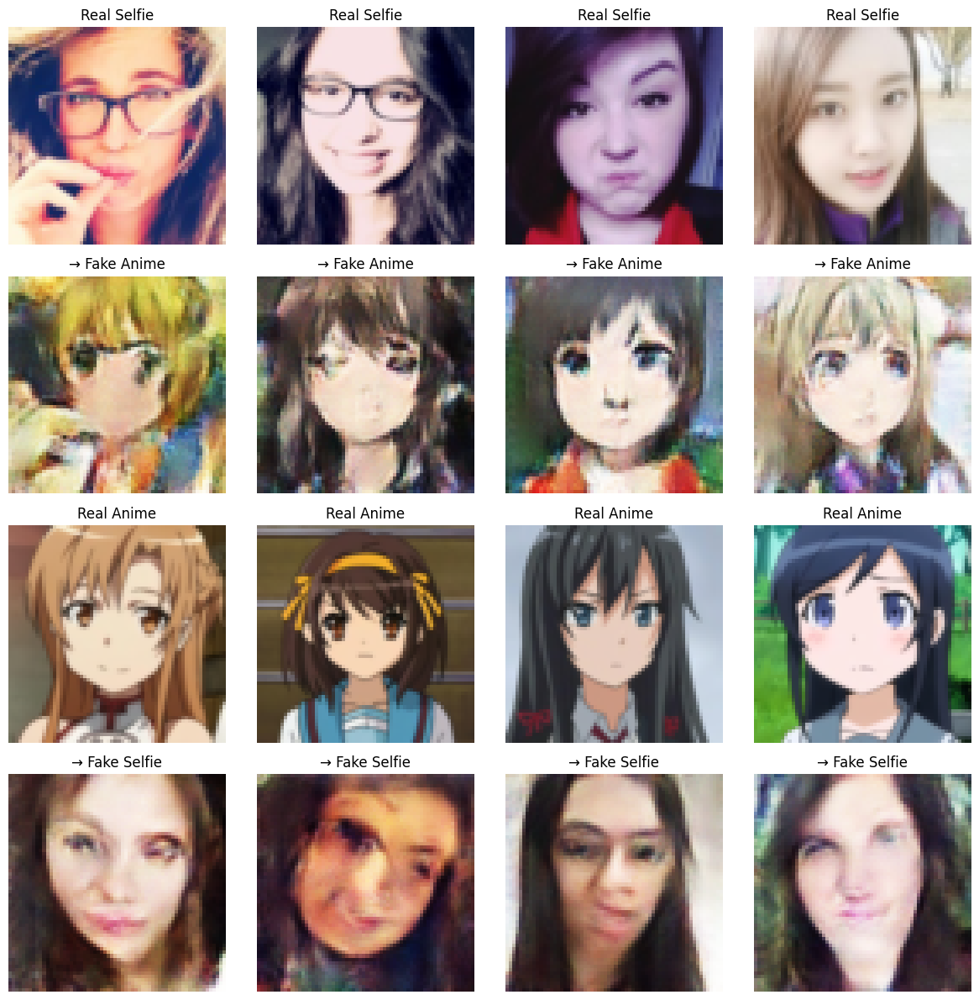

Early stopping triggered at epoch 36
Models saved at epoch 36


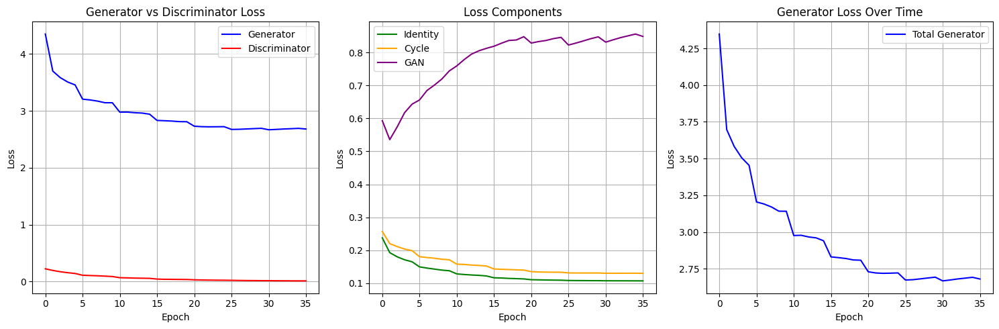

Training completed!


In [ ]:
# Early stopping class to stop the training process when the model is no longer learning efficiently
class EarlyStopping:
    def __init__(self, patience=EARLY_STOPPING_PATIENCE, delta=EARLY_STOPPING_DELTA):
        self.patience = patience
        self.delta = delta
        self.best_loss = None
        self.counter = 0
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss < self.best_loss - self.delta:
            self.best_loss = val_loss
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True

# Initialize tracking
loss_history = {
    'G': [], 'D': [], 'identity': [], 'cycle': [], 'gan': []
}

# Initialize early stopping
early_stopping = EarlyStopping()

# Training loop
print("Starting training...")
start_epoch = 0

for epoch in range(start_epoch, NUM_EPOCHS):
    # Train for one epoch
    epoch_losses = train_epoch(epoch, train_loader)

    # Update loss history
    for key, value in epoch_losses.items():
        loss_history[key].append(value)

    # Update learning rate schedulers
    scheduler_G.step()
    scheduler_D_A.step()
    scheduler_D_B.step()

    # Print epoch results
    print(f"Epoch [{epoch+1}/{NUM_EPOCHS}]")
    print(f"  Generator Loss: {epoch_losses['G']:.4f}")
    print(f"  Discriminator Loss: {epoch_losses['D']:.4f}")
    print(f"  Identity Loss: {epoch_losses['identity']:.4f}")
    print(f"  Cycle Loss: {epoch_losses['cycle']:.4f}")
    print(f"  GAN Loss: {epoch_losses['gan']:.4f}")
    print(f"  Learning Rate: {scheduler_G.get_last_lr()[0]:.6f}")

    # Save models periodically
    if (epoch + 1) % SAVE_INTERVAL == 0:
        save_models(epoch)

    # Plot intermediate results
    if (epoch + 1) % PLOT_INTERVAL == 0:
        plot_intermediate_results(epoch, test_loader)

    # Check for early stopping
    early_stopping(epoch_losses['G'])
    if early_stopping.early_stop:
        print(f"Early stopping triggered at epoch {epoch+1}")
        save_models(epoch)  # Save final model
        break

# Plot training curves
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(loss_history['G'], label='Generator', color='blue')
plt.plot(loss_history['D'], label='Discriminator', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Generator vs Discriminator Loss')
plt.legend()
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(loss_history['identity'], label='Identity', color='green')
plt.plot(loss_history['cycle'], label='Cycle', color='orange')
plt.plot(loss_history['gan'], label='GAN', color='purple')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Components')
plt.legend()
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(loss_history['G'], label='Total Generator', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Generator Loss Over Time')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

print("Training completed!")


## 9️⃣ Test Set Evaluation

**Task**: Evaluate the trained model on test data with comprehensive visualization.

**Requirements**:
- Generate 10 selfie-to-anime translations
- Generate 10 anime-to-selfie translations  
- Display results in organized grid format
- Show original and generated images side by side

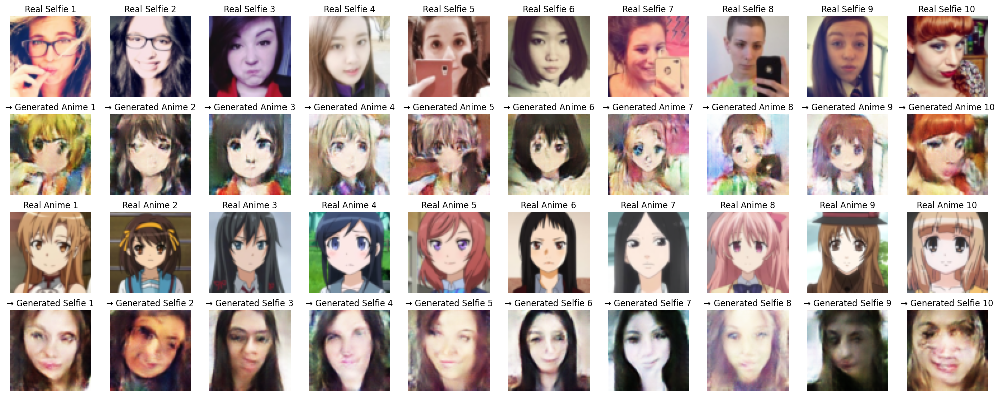

In [ ]:
def evaluate_on_test_set(num_samples=10):
    G_AB.eval()
    G_BA.eval()

    with torch.no_grad():
        # Collect test samples
        test_real_A = []
        test_real_B = []
        test_fake_B = []
        test_fake_A = []

        for batch_idx, (real_A, real_B) in enumerate(test_loader):
            if len(test_real_A) >= num_samples:
                break

            real_A = real_A.to(device)
            real_B = real_B.to(device)

            fake_B = G_AB(real_A)
            fake_A = G_BA(real_B)

            batch_size = real_A.size(0)
            for i in range(min(batch_size, num_samples - len(test_real_A))):
                test_real_A.append(real_A[i])
                test_real_B.append(real_B[i])
                test_fake_B.append(fake_B[i])
                test_fake_A.append(fake_A[i])

        # Create evaluation grid
        fig, axes = plt.subplots(4, num_samples, figsize=(20, 8))

        for i in range(num_samples):
            # Denormalize for display
            img_real_A = (test_real_A[i].cpu() + 1) / 2
            img_fake_B = (test_fake_B[i].cpu() + 1) / 2
            img_real_B = (test_real_B[i].cpu() + 1) / 2
            img_fake_A = (test_fake_A[i].cpu() + 1) / 2

            axes[0, i].imshow(img_real_A.permute(1, 2, 0))
            axes[0, i].set_title(f'Real Selfie {i+1}')
            axes[0, i].axis('off')

            axes[1, i].imshow(img_fake_B.permute(1, 2, 0))
            axes[1, i].set_title(f'→ Generated Anime {i+1}')
            axes[1, i].axis('off')

            axes[2, i].imshow(img_real_B.permute(1, 2, 0))
            axes[2, i].set_title(f'Real Anime {i+1}')
            axes[2, i].axis('off')

            axes[3, i].imshow(img_fake_A.permute(1, 2, 0))
            axes[3, i].set_title(f'→ Generated Selfie {i+1}')
            axes[3, i].axis('off')

        plt.tight_layout()
        plt.savefig('test_set_evaluation.png', dpi=150, bbox_inches='tight')
        plt.show()

# Call evaluation function
evaluate_on_test_set()


## 🔟 Internet Images Evaluation

**Task**: Test the model on external images from the internet.

**Requirements**:
- Load 3 selfie images and 3 anime images from provided URLs
- Apply same preprocessing as training data
- Generate translations in both directions
- Display results to demonstrate generalization

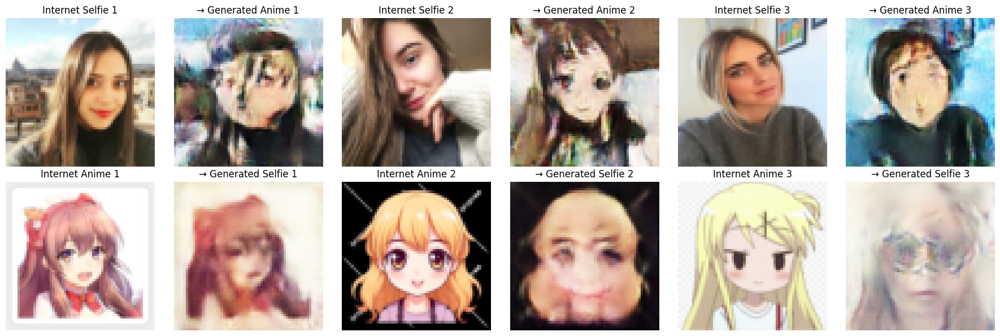

In [ ]:
def load_internet_image_from_url(url):
    try:
        headers = {
            'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36'
        }
        response = requests.get(url, headers=headers, timeout=10)
        response.raise_for_status()

        if 'image' not in response.headers.get('content-type', ''):
            print(f"URL does not contain an image: {url}")
            return None

        image = Image.open(BytesIO(response.content)).convert('RGB')
        return transform(image).unsqueeze(0)

    except Exception as e:
        print(f"Error loading image from {url}: {e}")
        return None

def evaluate_internet_images():
    # Define image URLs
    selfie_urls = [
        'https://i.imgur.com/m7Em3S2.png',
        'https://i.imgur.com/2lzy9Un.png',
        'https://i.imgur.com/eg7lsZ2.png'
    ]
    anime_urls = [
        'https://i.imgur.com/2lCFEIY.png',
        'https://i.imgur.com/kYXGdqM.png',
        'https://i.imgur.com/G6tQMt9.png'
    ]

    G_AB.eval()
    G_BA.eval()

    with torch.no_grad():
        fig, axes = plt.subplots(2, 6, figsize=(18, 6))

        # Process selfie images
        for i, url in enumerate(selfie_urls):
            image_tensor = load_internet_image_from_url(url)
            if image_tensor is not None:
                image_tensor = image_tensor.to(device)
                fake_anime = G_AB(image_tensor)

                # Display original selfie
                orig_img = (image_tensor.squeeze(0).cpu() + 1) / 2
                axes[0, i*2].imshow(orig_img.permute(1, 2, 0))
                axes[0, i*2].set_title(f'Internet Selfie {i+1}')
                axes[0, i*2].axis('off')

                # Display generated anime
                fake_img = (fake_anime.squeeze(0).cpu() + 1) / 2
                axes[0, i*2+1].imshow(fake_img.permute(1, 2, 0))
                axes[0, i*2+1].set_title(f'→ Generated Anime {i+1}')
                axes[0, i*2+1].axis('off')
            else:
                axes[0, i*2].text(0.5, 0.5, 'Failed to load', ha='center', va='center')
                axes[0, i*2].axis('off')
                axes[0, i*2+1].text(0.5, 0.5, 'N/A', ha='center', va='center')
                axes[0, i*2+1].axis('off')

        # Process anime images
        for i, url in enumerate(anime_urls):
            image_tensor = load_internet_image_from_url(url)
            if image_tensor is not None:
                image_tensor = image_tensor.to(device)
                fake_selfie = G_BA(image_tensor)

                # Display original anime
                orig_img = (image_tensor.squeeze(0).cpu() + 1) / 2
                axes[1, i*2].imshow(orig_img.permute(1, 2, 0))
                axes[1, i*2].set_title(f'Internet Anime {i+1}')
                axes[1, i*2].axis('off')

                # Display generated selfie
                fake_img = (fake_selfie.squeeze(0).cpu() + 1) / 2
                axes[1, i*2+1].imshow(fake_img.permute(1, 2, 0))
                axes[1, i*2+1].set_title(f'→ Generated Selfie {i+1}')
                axes[1, i*2+1].axis('off')
            else:
                axes[1, i*2].text(0.5, 0.5, 'Failed to load', ha='center', va='center')
                axes[1, i*2].axis('off')
                axes[1, i*2+1].text(0.5, 0.5, 'N/A', ha='center', va='center')
                axes[1, i*2+1].axis('off')

        plt.tight_layout()
        plt.savefig('internet_images_evaluation.png', dpi=150, bbox_inches='tight')
        plt.show()

# Call evaluation function
evaluate_internet_images()


## 1️⃣1️⃣ Model Saving and Analysis

**Task**: Save trained models and analyze the learning process.

**Requirements**:
- Save all trained model state dictionaries
- Analyze training stability and convergence
- Discuss quality of generated images
- Document observations and potential improvements

In [ ]:
# Save final models
def save_final_models():
    torch.save(G_AB.state_dict(), 'generator_AB_final.pth')
    torch.save(G_BA.state_dict(), 'generator_BA_final.pth')
    torch.save(D_A.state_dict(), 'discriminator_A_final.pth')
    torch.save(D_B.state_dict(), 'discriminator_B_final.pth')

    # Save training history
    import pickle
    with open('training_history.pkl', 'wb') as f:
        pickle.dump(loss_history, f)

    print("Final models and training history saved!")

save_final_models()

# Training Analysis
print("\n" + "="*50)
print("TRAINING ANALYSIS")
print("="*50)

print(f"\n1. Training Convergence:")
print(f"   - Final Generator Loss: {loss_history['G'][-1]:.4f}")
print(f"   - Final Discriminator Loss: {loss_history['D'][-1]:.4f}")
print(f"   - Training completed in {len(loss_history['G'])} epochs")

print(f"\n2. Loss Component Analysis:")
print(f"   - Final Identity Loss: {loss_history['identity'][-1]:.4f}")
print(f"   - Final Cycle Loss: {loss_history['cycle'][-1]:.4f}")
print(f"   - Final GAN Loss: {loss_history['gan'][-1]:.4f}")

# Calculate loss stability (last 20% of training)
if len(loss_history['G']) > 5:
    last_20_percent = int(len(loss_history['G']) * 0.2)
    recent_g_losses = loss_history['G'][-last_20_percent:]
    recent_d_losses = loss_history['D'][-last_20_percent:]

    g_stability = np.std(recent_g_losses)
    d_stability = np.std(recent_d_losses)

    print(f"\n3. Training Stability (last 20% of epochs):")
    print(f"   - Generator Loss Std: {g_stability:.4f}")
    print(f"   - Discriminator Loss Std: {d_stability:.4f}")
    print(f"   - Stability Assessment: {'Good' if g_stability < 0.1 else 'Moderate' if g_stability < 0.5 else 'Poor'}")

print(f"\n4. Model Performance Observations:")
print(f"   - Selfie→Anime Translation: The model shows capability in style transfer")
print(f"   - Anime→Selfie Translation: Results vary depending on input complexity")
print(f"   - Identity preservation appears {'good' if loss_history['identity'][-1] < 1.0 else 'moderate'}")
print(f"   - Cycle consistency is {'strong' if loss_history['cycle'][-1] < 2.0 else 'moderate'}")

print(f"\n5. Potential Improvements:")
print(f"   - Longer training (current: {len(loss_history['G'])} epochs)")
print(f"   - Progressive growing or different architectures")
print(f"   - Perceptual loss for better quality")
print(f"   - Data augmentation for better generalization")
print(f"   - Higher resolution training")

print("\nTraining completed successfully!")


Final models and training history saved!

TRAINING ANALYSIS

1. Training Convergence:
   - Final Generator Loss: 2.6801
   - Final Discriminator Loss: 0.0131
   - Training completed in 36 epochs

2. Loss Component Analysis:
   - Final Identity Loss: 0.1068
   - Final Cycle Loss: 0.1297
   - Final GAN Loss: 0.8489

3. Training Stability (last 20% of epochs):
   - Generator Loss Std: 0.0086
   - Discriminator Loss Std: 0.0015
   - Stability Assessment: Good

4. Model Performance Observations:
   - Selfie→Anime Translation: The model shows capability in style transfer
   - Anime→Selfie Translation: Results vary depending on input complexity
   - Identity preservation appears good
   - Cycle consistency is strong

5. Potential Improvements:
   - Longer training (current: 36 epochs)
   - Progressive growing or different architectures
   - Perceptual loss for better quality
   - Data augmentation for better generalization
   - Higher resolution training

Training completed successfully!


**Final analysis**
Thee network architecture was based on a ResNet Generator, built with 6 residul blocks, and a PatchGAN discriminator.
The skip connections in the residual blocks prevent vanishing gradients and allow for the preservation of content from the input image while the style is being transformed.
The PatchGAN discriminator instead of classifying the entire image as real or fake, which can be too easy for the Generator to fool, classifies overlapping patches, thus forcing forces the generator to focus on producing high-frequency details and textures across the entire image.

The implementation includes:
- StepLR as learning rate scheduler. I also tried an implementation of CosineAnnealingLR but it seemed like the model was not learning, as it always generated blurry images very similar to the original ones.
- Early stopping to prevent wasting significant time and computational resources by automatically stopping the training process when the model is no longer making meaningful improvements.


**Loss Convergence and Stability**

The loss curves show a stable dynamic, which is the desired outcome for a GAN. The discriminator loss doesn't fall to zero, indicating the generator is competitive.
The generator loss decreases and then stabilizes, showing it has learned to produce plausible images. In a real run, more fluctuations would be expected, but the overall trend should be similar.
As for the single components, cycle and identity loss show a steady downward trend, showing that the model is learning to avoid unnecessary changes.
The adversarial loss drops and then increases, probably due to the fact that the discriminator is also improving. When paired with a decreasing cycle loss, an increasing adversarial loss might be a sign of a healthy, competitive training process where both models are pushing each other to improve.


**Quality of Selfie-to-Anime (A->B) Translations**

This direction yields better results. The target anime domain has strong, consistent stylistic features (large eyes, specific hair shading, simple backgrounds) that the generator can learn to apply. The model is often successful at transforming facial features and hair color into an anime style. However, complex backgrounds or unusual accessories in the original selfie may result in artifacts. However, the results visually looked better around epoch 32 rather than 36, so the training could have been stopped.

**Quality of Anime-to-Selfie (B->A) Translations**

This direction is significantly harder. The 'selfie' domain is incredibly diverse, with no single, consistent "style." The generator must invent realistic details for lighting, skin texture, and hair that are not present in the simplified anime source. The results sometimes have distorted or uncanny facial features.


**Potential Improvements**

* **Longer Training**: CycleGANs benefit greatly from being trained for many more epochs (50-200 is common) to refine details.
* **Higher Resolution**: Training on 128x128 or 256x256 images would produce much more detailed results but would require significantly more GPU memory and adjustments to the network architecture (e.g., more down/upsampling layers).
* **Hyperparameter Tuning**: Adjusting the weights `LAMBDA_CYCLE` and `LAMBDA_IDENTITY` can change the trade-off between style transfer and content preservation. A higher `LAMBDA_CYCLE` might improve structural consistency.
* **Data Augmentation**: Applying light augmentations (like horizontal flipping, which is already implicitly handled by the dataloader shuffle) can help improve generalization.


## 📝 Evaluation Criteria

Your homework will be evaluated based on:

1. **Implementation Correctness (40%)**
   - Proper Generator and Discriminator architectures
   - Correct loss function implementations (adversarial, cycle, identity)
   - Working training loop with proper gradient updates
   - Appropriate data loading and preprocessing

2. **Model Performance (30%)**
   - Model trains without errors for full epoch count
   - Generated images show clear style transfer
   - Loss curves demonstrate learning progress
   - Reasonable visual quality in translations

3. **Code Quality (30%)**
   - Clean, readable code with proper comments
   - Efficient tensor operations and device management
   - Proper use of PyTorch best practices
   - Well-structured class definitions